# SWB Mood HFA pow Regressions
- beta, theta, hfa first

*Created:* 10/05/2024 \
*Updated:* 10/05/2024 \


In [1]:
import numpy as np
import mne
from glob import glob
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from scipy.stats import zscore, linregress, ttest_ind, ttest_rel, ttest_1samp, pearsonr, spearmanr
import pandas as pd
from mne.preprocessing.bads import _find_outliers
import os 
import joblib
import re
import datetime
import scipy
import random
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.regression.mixed_linear_model import MixedLM 
from joblib import Parallel, delayed
import pickle
import itertools
import time 
from matplotlib.ticker import StrMethodFormatter
import sys


import warnings
warnings.filterwarnings('ignore')




In [2]:
# Specify root directory for un-archived data and results 
base_dir   = '/sc/arion/projects/guLab/Alie/SWB/ephys_analysis/'
anat_dir   = f'{base_dir}recon_labels/'
neural_dir = f'{base_dir}data/'
behav_dir  = f'{base_dir}behav/'
save_dir   = f'{base_dir}results/mood_results/'

os.makedirs(save_dir,exist_ok=True)

date = datetime.date.today().strftime('%m%d%Y')
print(date)

10052024


In [3]:
%load_ext autoreload
%autoreload 2


sys.path.append(f'{base_dir}LFPAnalysis/')

from LFPAnalysis import analysis_utils

script_dir = '/hpc/users/finka03/swb_ephys_analysis/scripts/'
sys.path.append(f'{script_dir}analysis_notebooks/')

from ieeg_tools import *
from plot_tools import *

sys.path.append(f'{script_dir}behav/')

from behav_utils import *
from swb_subj_behav import *

In [4]:
subj_ids = list(pd.read_excel(f'{base_dir}subj_info/SWB_subjects.xlsx', sheet_name='Usable_Subjects', usecols=[0]).PatientID)
n_subj = len(subj_ids)
# subj_ids


In [ ]:

#### set theme for all plots
# %matplotlib inline
# from matplotlib import rc
# rc('text', usetex=False)

# sns.set_theme(style='ticks') 
# sns.set_context("talk")

# from matplotlib.colors import ListedColormap,LinearSegmentedColormap
# import matplotlib as mpl
# from matplotlib import cm


# # saez_cmap colors = org,yellow, sagegreen, darker green, blue, purple 

# # 671351
# saez_colors    = ['#ffb243','#FCE27C','#6a9752','#1d5d2a','#00467e','#561C46']
# saez_hex_cmap  = ListedColormap(saez_colors)
# saez_rgb       = [mpl.colors.to_rgb(hex) for hex in saez_colors]
# saez_full_cmap = LinearSegmentedColormap.from_list('saez_full_cmap',saez_rgb,N=10)
# #plot_palette = saez_linear_cmap.resampled(lutsize=30)
# expanded_cmap  = [mpl.colors.rgb2hex(saez_full_cmap(c)[:3]) for c in range(saez_full_cmap.N)]


In [6]:
# raw_behav = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_task_df.csv') for subj_id in subj_ids]
# all_behav,beh_drops = format_all_behav(raw_behav,return_drops=True)
# del raw_behav
# # beh_drops
# all_behav = pd.read_csv(f'{behav_dir}all_behav.csv') ## this isn't normalized yet 
# raw_mood = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_mood_df.csv') for subj_id in subj_ids]
# all_mood, mood_drops = format_all_mood(raw_mood, all_behav, return_drops=True, drop_bads=False)


# Load Mood Epochs dfs

In [5]:
band = 'hfa'

mood_pow_df = pd.read_csv(f'{save_dir}regression_dfs/{band}_mood_epochs_df.csv')
mood_pow_df.head()

,Unnamed: 0,epoch,time,freq,reref_ch_names,band_pow,band,subj_id,bdi,bdi_thresh,...,cf_t2,cf_t3,cpe_t1,cpe_t2,cpe_t3,mood_epoch_len,next_round_start,roi,hemi,unique_reref_ch
0,0,0,-0.5,118.986976,lacas1-lacas2,0.027425,hfa,MS002,14,low,...,-0.153542,0.379924,0.732357,-0.448423,-0.399479,5.310698,545.592613,acc,l,MS002_lacas1-lacas2
1,1,1,-0.5,118.986976,lacas1-lacas2,-0.067583,hfa,MS002,14,low,...,0.337002,-0.460131,0.622232,0.401983,0.438692,3.432630,577.049490,acc,l,MS002_lacas1-lacas2
2,2,2,-0.5,118.986976,lacas1-lacas2,0.232167,hfa,MS002,14,low,...,-0.153542,-0.337495,-0.723734,0.132790,-0.595256,3.599831,609.642231,acc,l,MS002_lacas1-lacas2
3,3,3,-0.5,118.986976,lacas1-lacas2,-0.019490,hfa,MS002,14,low,...,0.153048,0.214366,-0.601374,0.340803,-0.234292,3.984104,643.713750,acc,l,MS002_lacas1-lacas2
4,4,4,-0.5,118.986976,lacas1-lacas2,0.087663,hfa,MS002,14,low,...,0.398319,0.030412,0.866954,-0.417833,-0.417833,4.350371,677.264040,acc,l,MS002_lacas1-lacas2


In [6]:
keep_rois = ['dlpfc','vlpfc','dmpfc','ofc','ains','pins','acc','amy','hpc']     
mood_pow_df = mood_pow_df[mood_pow_df.roi.isin(keep_rois)]


# Electrode-wise Regressions

In [7]:
# define interaction vector
mood_pow_df['mood_cpe_int'] = np.multiply(mood_pow_df['norm_mood'],mood_pow_df['cpe_t1'])
# remove nans and null values from df 
mood_pow_df = mood_pow_df[~mood_pow_df.norm_mood.isnull()]
mood_pow_df = mood_pow_df[~mood_pow_df.cpe_t1.isnull()]
mood_pow_df = mood_pow_df[~mood_pow_df.mood_cpe_int.isnull()]


In [8]:
elec_col    = 'unique_reref_ch'
reg_formula = 'band_pow~norm_mood+cpe_t1+mood_cpe_int'
n_permutations = 1000


In [10]:
results_dict = run_individual_elec_regression(mood_pow_df,reg_formula,elec_col,n_permutations)


Permutations:  75%|███████▌  | 752/1000 [00:00<00:00, 3155.19it/s]


KeyboardInterrupt: 

In [11]:
save_vars = results_dict['MS002_lacas1-lacas2'].index.tolist()
save_vars


['Intercept', 'norm_mood', 'cpe_t1', 'mood_cpe_int']

In [12]:
results = single_elec_permutation_results(results_dict,mood_pow_df,save_vars)
results



,unique_elec_id,subj_id,roi,bdi,Original_Estimate_Intercept,Original_Estimate_norm_mood,Original_Estimate_cpe_t1,Original_Estimate_mood_cpe_int,Permuted_Mean_Intercept,Permuted_Mean_norm_mood,...,Permuted_Std_cpe_t1,Permuted_Std_mood_cpe_int,Z_Score_Intercept,Z_Score_norm_mood,Z_Score_cpe_t1,Z_Score_mood_cpe_int,P_Value_Intercept,P_Value_norm_mood,P_Value_cpe_t1,P_Value_mood_cpe_int
0,MS002_lacas1-lacas2,MS002,acc,14,-0.013493,0.063523,0.003595,0.055149,-0.010774,0.000782,...,0.035270,0.058745,-0.960776,1.640456,0.093587,0.977187,0.336665,0.100910,0.925438,0.328476
1,MS002_lacas2-lacas3,MS002,acc,14,-0.017593,0.032214,0.016307,-0.008503,-0.018079,-0.000305,...,0.035993,0.060972,0.165874,0.840364,0.420041,-0.141513,0.868256,0.400704,0.674455,0.887465
2,MS002_lacas3-lacas4,MS002,acc,14,-0.016187,0.030227,0.008283,0.002662,-0.015959,0.000190,...,0.037297,0.062378,-0.075906,0.728890,0.180401,0.087944,0.939493,0.466069,0.856838,0.929921
3,MS002_lacas4-lacas5,MS002,acc,14,-0.002604,0.004001,-0.026463,-0.015547,-0.003293,0.000261,...,0.028497,0.048520,0.295372,0.120500,-0.873853,-0.351675,0.767710,0.904087,0.382198,0.725082
4,MS002_lacas5-lacas6,MS002,acc,14,0.009291,-0.017196,-0.033526,0.063501,0.012552,0.001220,...,0.029196,0.047407,-1.428129,-0.574510,-1.130171,1.371204,0.153255,0.565623,0.258404,0.170311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,DA039_rpins1-rpins2,DA039,pins,22,-0.000342,0.035979,-0.058375,-0.061877,-0.004395,0.001729,...,0.064810,0.094271,0.358716,0.724476,-0.880053,-0.673653,0.719808,0.468773,0.378831,0.500532
1046,DA039_rpins2-rpins3,DA039,pins,22,-0.030787,0.006185,-0.023121,-0.046768,-0.035077,-0.000331,...,0.060867,0.086281,0.394350,0.139488,-0.364375,-0.524274,0.693322,0.889065,0.715578,0.600088
1047,DA039_rpins3-rpins4,DA039,pins,22,-0.007317,-0.008973,-0.009146,0.020254,-0.004721,-0.001410,...,0.094047,0.135529,-0.154467,-0.105657,-0.094033,0.157908,0.877242,0.915855,0.925083,0.874529
1048,DA039_rsgcc6-rsgcc7,DA039,vlpfc,22,-0.014496,0.058269,-0.105510,0.042682,-0.003303,-0.000110,...,0.038351,0.056574,-1.589675,2.083404,-2.755633,0.722261,0.111908,0.037214,0.005858,0.470134


In [14]:
results.columns



Index(['unique_elec_id', 'subj_id', 'roi', 'bdi',
       'Original_Estimate_Intercept', 'Original_Estimate_norm_mood',
       'Original_Estimate_cpe_t1', 'Original_Estimate_mood_cpe_int',
       'Permuted_Mean_Intercept', 'Permuted_Mean_norm_mood',
       'Permuted_Mean_cpe_t1', 'Permuted_Mean_mood_cpe_int',
       'Permuted_Std_Intercept', 'Permuted_Std_norm_mood',
       'Permuted_Std_cpe_t1', 'Permuted_Std_mood_cpe_int', 'Z_Score_Intercept',
       'Z_Score_norm_mood', 'Z_Score_cpe_t1', 'Z_Score_mood_cpe_int',
       'P_Value_Intercept', 'P_Value_norm_mood', 'P_Value_cpe_t1',
       'P_Value_mood_cpe_int'],
      dtype='object')

### Save results as pickle file

In [20]:
# save_path = f'{save_dir}/{band}/'
# os.makedirs(save_path, exist_ok=True)

# fname = f'{save_path}{band}_perm_regression_results_{epoch_len}.pkl'
# pickle.dump(results, open(fname,"wb"))


In [15]:
sig_data = results[results.P_Value_norm_mood < 0.05]
sig_data



,unique_elec_id,subj_id,roi,bdi,Original_Estimate_Intercept,Original_Estimate_norm_mood,Original_Estimate_cpe_t1,Original_Estimate_mood_cpe_int,Permuted_Mean_Intercept,Permuted_Mean_norm_mood,...,Permuted_Std_cpe_t1,Permuted_Std_mood_cpe_int,Z_Score_Intercept,Z_Score_norm_mood,Z_Score_cpe_t1,Z_Score_mood_cpe_int,P_Value_Intercept,P_Value_norm_mood,P_Value_cpe_t1,P_Value_mood_cpe_int
17,MS002_laims6-laims7,MS002,vlpfc,14,-0.018944,-0.283809,0.137922,-0.148015,-0.027110,0.002780,...,0.091990,0.162489,1.046987,-2.784579,1.545013,-0.963394,0.295106,0.005360,0.122343,0.335350
54,MS002_racas12-racas13,MS002,dmpfc,14,-0.005151,-0.075857,-0.005603,-0.128295,-0.011339,0.002894,...,0.030127,0.051672,2.486829,-2.438003,-0.210256,-2.526692,0.012889,0.014769,0.833468,0.011514
77,MS003_lacas2-lacas3,MS003,acc,8,-0.007313,-0.069221,-0.025353,0.043747,-0.004444,0.000618,...,0.034534,0.062337,-0.569082,-2.030707,-0.703057,0.652257,0.569300,0.042285,0.482020,0.514235
88,MS003_laimm5-laimm6,MS003,vlpfc,8,0.046635,-0.110245,0.081193,-0.064900,0.042669,0.001877,...,0.043459,0.082796,0.591278,-2.585255,1.840895,-0.775463,0.554334,0.009731,0.065637,0.438066
92,MS003_lmolf1-lmolf2,MS003,ofc,8,-0.008646,-0.079557,-0.031594,-0.071240,-0.014972,0.000198,...,0.033967,0.063220,1.238655,-2.347937,-0.960520,-1.159339,0.215473,0.018878,0.336794,0.246318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
990,DA023_lam1-lam2,DA023,amy,14,0.038341,-0.159068,0.004291,0.010842,0.012245,0.001861,...,0.062960,0.142395,1.938755,-2.411237,0.049095,0.058152,0.052531,0.015899,0.960843,0.953627
1008,DA037_rof2-rof3,DA037,ofc,4,-0.026948,0.098547,-0.072086,0.050111,-0.027739,-0.000755,...,0.045719,0.095827,0.096218,2.279367,-1.584969,0.510668,0.923347,0.022645,0.112973,0.609583
1014,DA037_rmc7-rmc8,DA037,dlpfc,4,0.006976,0.118696,-0.090502,-0.110001,-0.008162,0.003710,...,0.051797,0.106968,1.626914,2.445661,-1.707176,-1.062753,0.103755,0.014459,0.087789,0.287894
1048,DA039_rsgcc6-rsgcc7,DA039,vlpfc,22,-0.014496,0.058269,-0.105510,0.042682,-0.003303,-0.000110,...,0.038351,0.056574,-1.589675,2.083404,-2.755633,0.722261,0.111908,0.037214,0.005858,0.470134


In [16]:
sig_data.roi.value_counts()



roi
dmpfc    23
acc      13
ofc      10
vlpfc     7
dlpfc     5
amy       5
pins      3
ains      3
hpc       3
Name: count, dtype: int64

In [17]:
sig_data.roi.unique()



array(['vlpfc', 'dmpfc', 'acc', 'ofc', 'pins', 'dlpfc', 'ains', 'amy',
       'hpc'], dtype=object)

### ROI Significance Testing
- % of sig elecs in ROI (also split by BDI)
- binomial test for whether sig proportion of elecs in ROI 
- ttests from zero 


In [22]:
# add mask col for sig cpe elecs 
results['norm_mood_sig']    = results['P_Value_norm_mood'].apply(lambda x: 0 if x > 0.05 else 1)
results['cpe_t1_sig']       = results['P_Value_cpe_t1'].apply(lambda x: 0 if x > 0.05 else 1)
results['mood_cpe_int_sig'] = results['P_Value_mood_cpe_int'].apply(lambda x: 0 if x > 0.05 else 1)
results['bdi_split']        = results['bdi'].apply(lambda x: 0 if x < 20 else 1)

results.head()

# results.to_csv(f'{save_path}{band}_perm_regression_results_df_{epoch_len}.csv')

,unique_elec_id,subj_id,roi,bdi,Original_Estimate_Intercept,Original_Estimate_norm_mood,Original_Estimate_cpe_t1,Original_Estimate_mood_cpe_int,Permuted_Mean_Intercept,Permuted_Mean_norm_mood,...,Z_Score_mood_cpe_int,P_Value_Intercept,P_Value_norm_mood,P_Value_cpe_t1,P_Value_mood_cpe_int,norm_mood_sig,cpe_t1_sig,mood-cpe_int_sig,bdi_split,mood_cpe_int_sig
0,MS002_lacas1-lacas2,MS002,acc,14,-0.013493,0.063523,0.003595,0.055149,-0.010774,0.000782,...,0.977187,0.336665,0.100910,0.925438,0.328476,0,0,0,0,0
1,MS002_lacas2-lacas3,MS002,acc,14,-0.017593,0.032214,0.016307,-0.008503,-0.018079,-0.000305,...,-0.141513,0.868256,0.400704,0.674455,0.887465,0,0,0,0,0
2,MS002_lacas3-lacas4,MS002,acc,14,-0.016187,0.030227,0.008283,0.002662,-0.015959,0.000190,...,0.087944,0.939493,0.466069,0.856838,0.929921,0,0,0,0,0
3,MS002_lacas4-lacas5,MS002,acc,14,-0.002604,0.004001,-0.026463,-0.015547,-0.003293,0.000261,...,-0.351675,0.767710,0.904087,0.382198,0.725082,0,0,0,0,0
4,MS002_lacas5-lacas6,MS002,acc,14,0.009291,-0.017196,-0.033526,0.063501,0.012552,0.001220,...,1.371204,0.153255,0.565623,0.258404,0.170311,0,0,0,0,0


In [23]:
reg_vars = ['Z_Score_norm_mood','Z_Score_cpe_t1','Z_Score_mood_cpe_int']


In [24]:
roi_sig_info = []
    
for roi in results.roi.unique().tolist():
    roi_results = results[results.roi==roi]
    roi_df = []
    for var in reg_vars:
        if var == 'Z_Score_mood_cpe_int':
            var_sig = ('_').join([var.split('_')[-3],var.split('_')[-2],var.split('_')[-1],'sig'])
        else: 
            var_sig = ('_').join([var.split('_')[-2],var.split('_')[-1],'sig'])
        # ttest from zero 
        ttest_stat,ttest_pval = ttest_1samp(roi_results[var],popmean=0)
        # binomial test for significance 
        n = len(roi_results)
        x = np.sum(roi_results[var_sig])
        binom_test = scipy.stats.binomtest(x, n, p=0.05, alternative='greater')
        binom_pval = binom_test.pvalue
        binom_prop = binom_test.statistic
        ci_low     = binom_test.proportion_ci(confidence_level=0.95).low
        ci_high    = binom_test.proportion_ci(confidence_level=0.95).high
        
        # agg results 
        roi_df.append(pd.DataFrame({'roi':roi,'var_id':var,'n_total':n,'n_sig':x,'prop_sig':np.divide(x,n),
                                          'n_sig_highbdi':np.sum(roi_results[roi_results.bdi_split==1][var_sig]),
                                          'ttest_stat':ttest_stat,'ttest_pval':ttest_pval,
                                          'binom_ci_low':ci_low,'binom_ci_high':ci_high,
                                          'binom_prop':binom_prop,'binom_pval':np.round(binom_pval,4)},index=[0]))
    
    roi_df = pd.concat(roi_df).reset_index(drop=True)
    roi_sig_info.append(roi_df)

roi_sig_info = pd.concat(roi_sig_info).reset_index(drop=True)

In [25]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_norm_mood']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
0,acc,Z_Score_norm_mood,167,13,0.077844,4,-2.078684,0.039185,0.046658,1.0,0.077844,0.0768
3,dmpfc,Z_Score_norm_mood,193,23,0.119171,5,-1.723947,0.086327,0.082833,1.0,0.119171,0.0001
6,amy,Z_Score_norm_mood,102,5,0.049020,1,-1.346388,0.181191,0.019511,1.0,0.049020,0.5817
9,ains,Z_Score_norm_mood,57,3,0.052632,2,-1.559601,0.124488,0.014497,1.0,0.052632,0.5475
12,vlpfc,Z_Score_norm_mood,75,7,0.093333,3,0.519190,0.605178,0.044628,1.0,0.093333,0.0810
15,hpc,Z_Score_norm_mood,124,3,0.024194,2,-1.999612,0.047746,0.006626,1.0,0.024194,0.9505
18,ofc,Z_Score_norm_mood,179,10,0.055866,2,-1.729365,0.085477,0.030619,1.0,0.055866,0.4058
21,pins,Z_Score_norm_mood,58,3,0.051724,1,-1.016563,0.313657,0.014245,1.0,0.051724,0.5594
24,dlpfc,Z_Score_norm_mood,95,5,0.052632,0,0.077719,0.938217,0.020965,1.0,0.052632,0.5181


In [26]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_cpe_t1']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
1,acc,Z_Score_cpe_t1,167,8,0.047904,1,-2.463436,0.014781,0.024057,1.0,0.047904,0.5994
4,dmpfc,Z_Score_cpe_t1,193,4,0.020725,0,-0.670797,0.503156,0.007110,1.0,0.020725,0.9882
7,amy,Z_Score_cpe_t1,102,9,0.088235,1,-2.497080,0.014138,0.046804,1.0,0.088235,0.0697
10,ains,Z_Score_cpe_t1,57,1,0.017544,1,-1.211485,0.230797,0.000899,1.0,0.017544,0.9463
13,vlpfc,Z_Score_cpe_t1,75,3,0.040000,3,-0.409082,0.683661,0.010990,1.0,0.040000,0.7303
16,hpc,Z_Score_cpe_t1,124,7,0.056452,0,-2.153285,0.033248,0.026791,1.0,0.056452,0.4266
19,ofc,Z_Score_cpe_t1,179,5,0.027933,1,-1.533303,0.126977,0.011070,1.0,0.027933,0.9476
22,pins,Z_Score_cpe_t1,58,0,0.000000,0,0.518760,0.605937,0.000000,1.0,0.000000,1.0000
25,dlpfc,Z_Score_cpe_t1,95,5,0.052632,2,-1.595972,0.113852,0.020965,1.0,0.052632,0.5181


In [27]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_mood_cpe_int']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
2,acc,Z_Score_mood_cpe_int,167,10,0.059880,2,-0.475837,0.634816,0.032843,1.0,0.059880,0.3254
5,dmpfc,Z_Score_mood_cpe_int,193,13,0.067358,2,-1.020135,0.308948,0.040299,1.0,0.067358,0.1711
8,amy,Z_Score_mood_cpe_int,102,5,0.049020,2,1.178037,0.241550,0.019511,1.0,0.049020,0.5817
11,ains,Z_Score_mood_cpe_int,57,3,0.052632,2,-2.076969,0.042404,0.014497,1.0,0.052632,0.5475
14,vlpfc,Z_Score_mood_cpe_int,75,5,0.066667,1,-0.456954,0.649043,0.026634,1.0,0.066667,0.3211
17,hpc,Z_Score_mood_cpe_int,124,5,0.040323,1,2.450073,0.015690,0.016020,1.0,0.040323,0.7479
20,ofc,Z_Score_mood_cpe_int,179,10,0.055866,1,-0.294352,0.768832,0.030619,1.0,0.055866,0.4058
23,pins,Z_Score_mood_cpe_int,58,0,0.000000,0,1.562049,0.123812,0.000000,1.0,0.000000,1.0000
26,dlpfc,Z_Score_mood_cpe_int,95,3,0.031579,1,0.148028,0.882638,0.008662,1.0,0.031579,0.8595


In [28]:
sig_rois = roi_sig_info[roi_sig_info.binom_pval<0.05]
sig_rois

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
3,dmpfc,Z_Score_norm_mood,193,23,0.119171,5,-1.723947,0.086327,0.082833,1.0,0.119171,0.0001


# Plot Results

In [34]:
# fig_save_path = f'{fig_dir}{band}/'
# os.makedirs(fig_save_path, exist_ok=True)

# fig_id = f'{band}_perm_regression_cpe_coeff_barplot_{epoch_len}.pdf'

# ylabel = fr'${band}_{{zpow}} \sim cpe$'


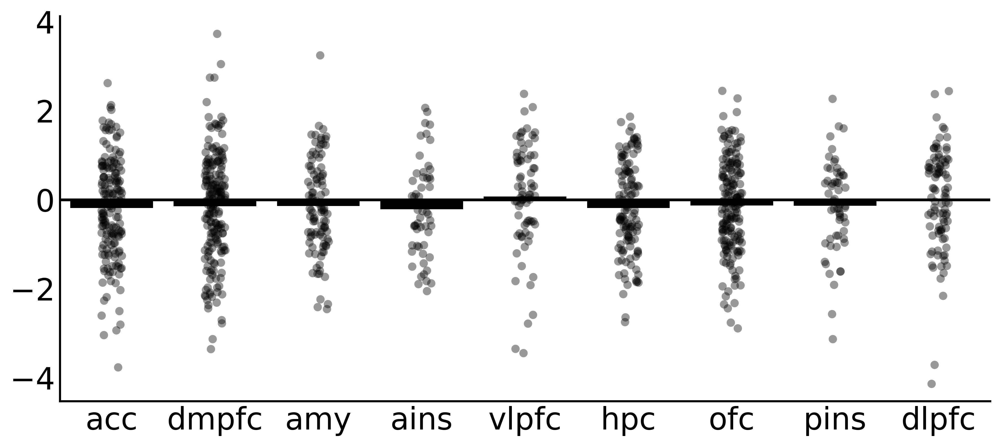

In [29]:
# plot_roi_model_results(results,'roi',cpe_var,bar_order=keep_rois,figsize=(12,5),color='k',
#                        ylabel=ylabel,save_fig=True,save_dir=fig_save_path,fig_id=fig_id,dpi=400)

plot_roi_model_results(results,'roi','Z_Score_norm_mood',figsize=(12,5),color='k')



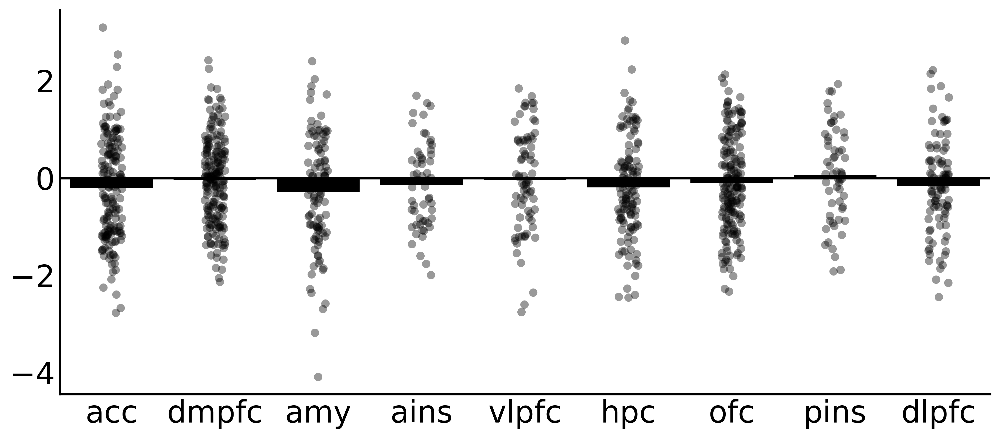

In [30]:
plot_roi_model_results(results,'roi','Z_Score_cpe_t1',figsize=(12,5),color='k')


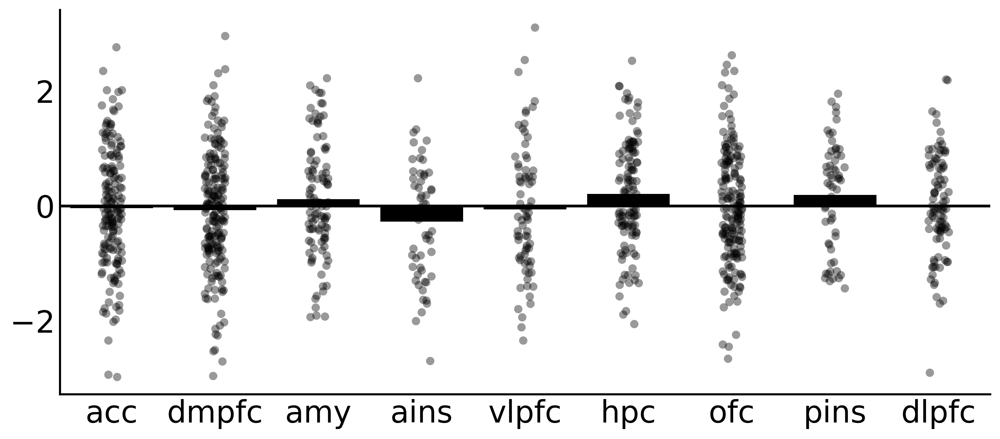

In [31]:
plot_roi_model_results(results,'roi','Z_Score_mood_cpe_int',figsize=(12,5),color='k')


## BDI correlations

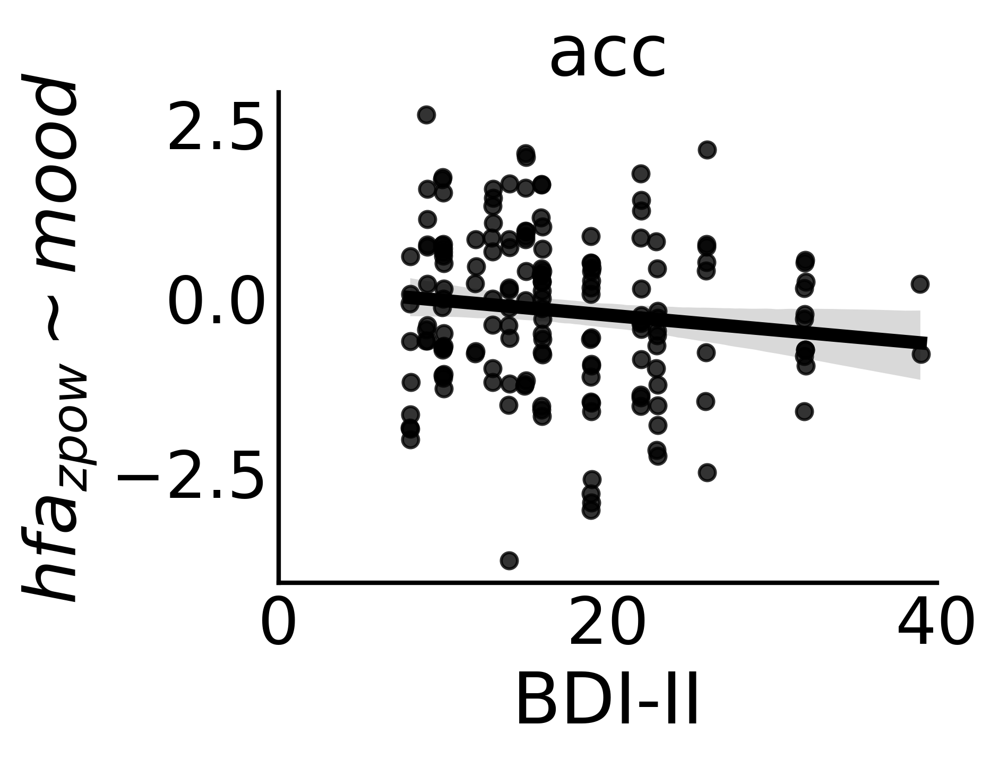

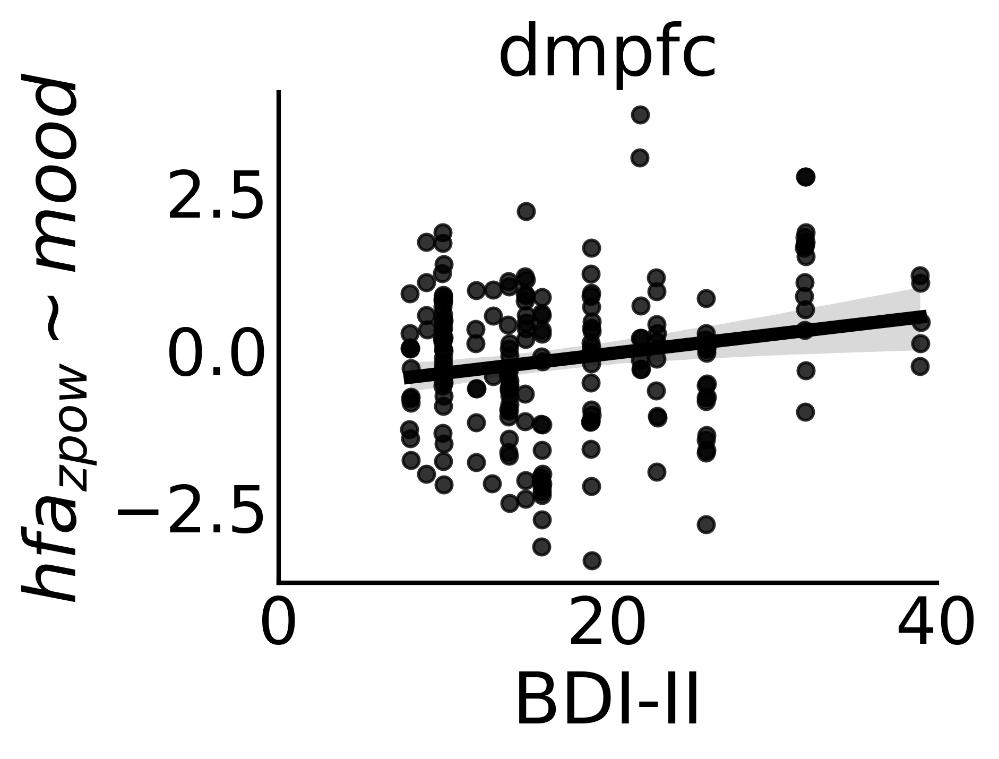

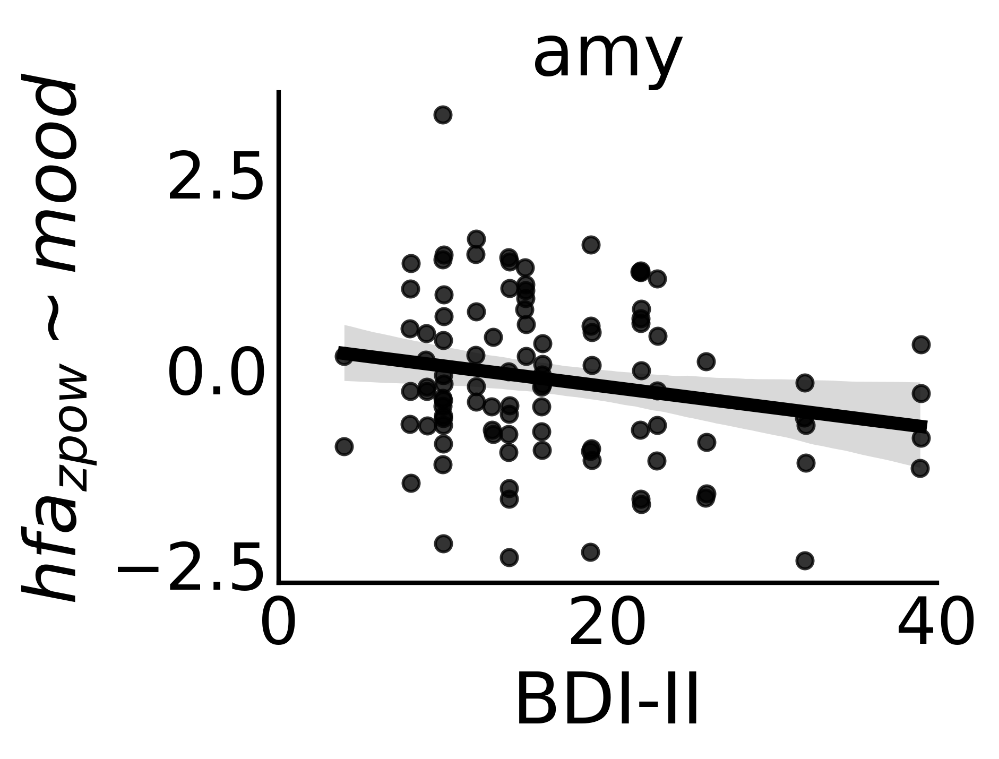

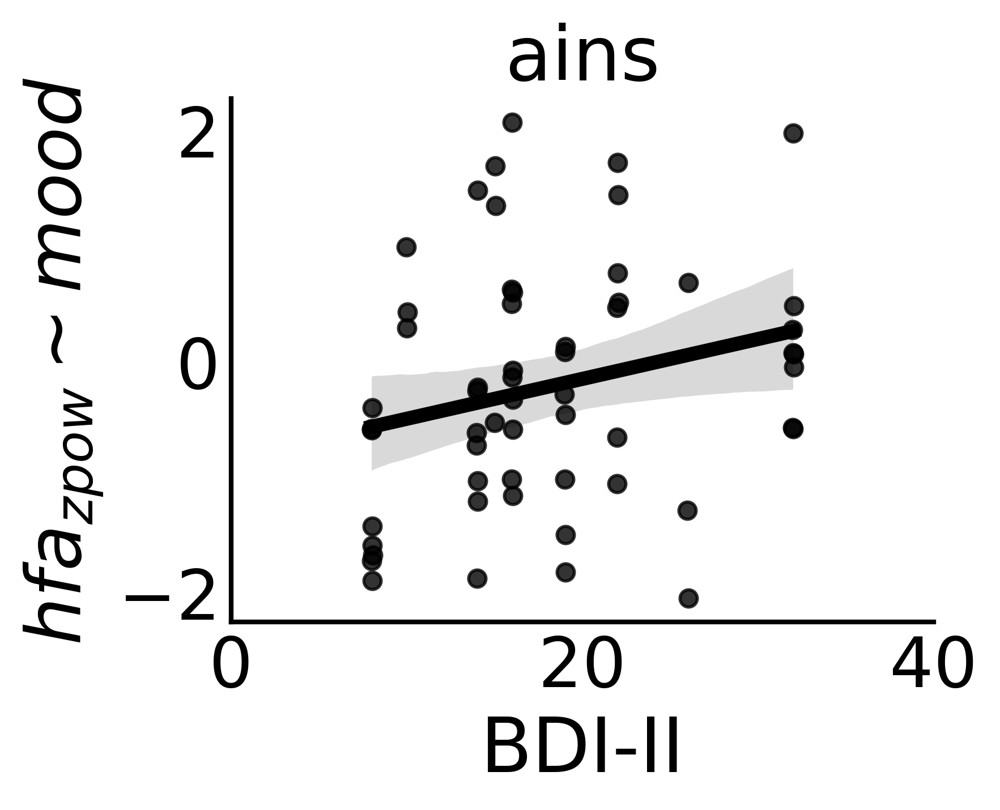

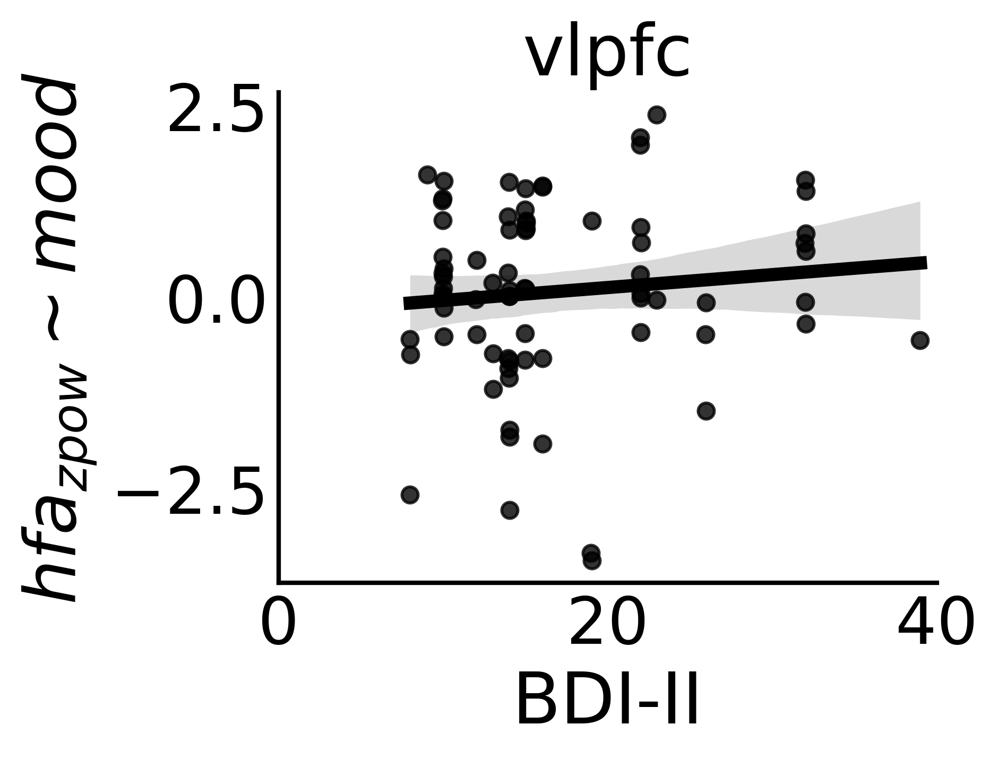

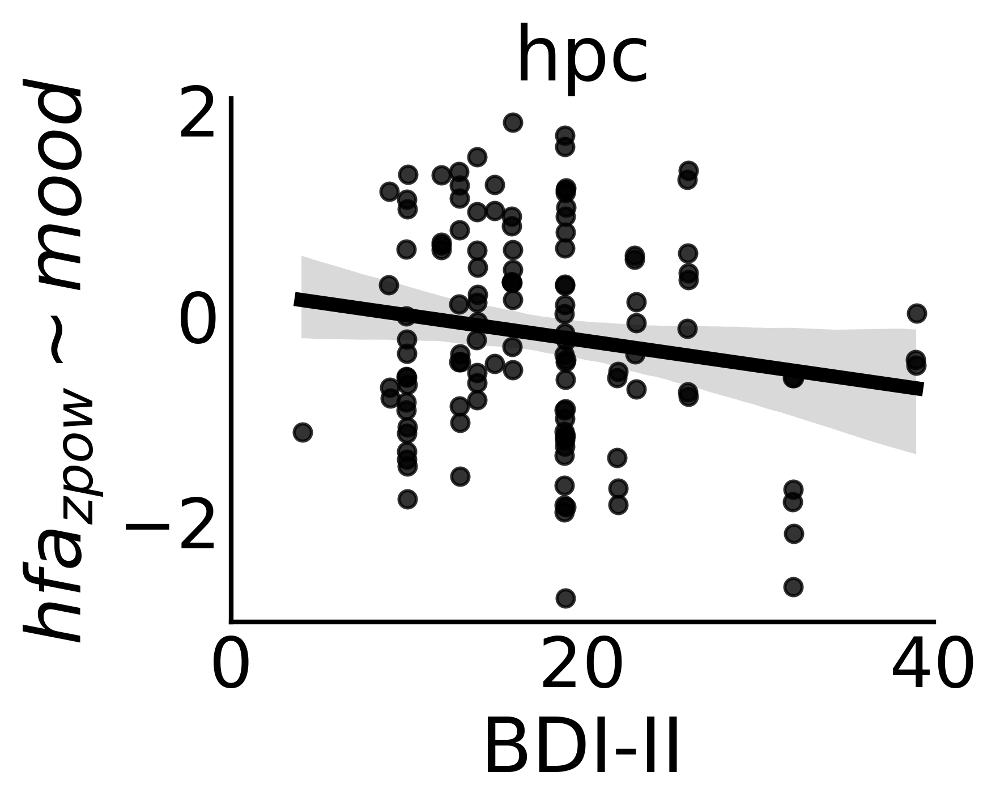

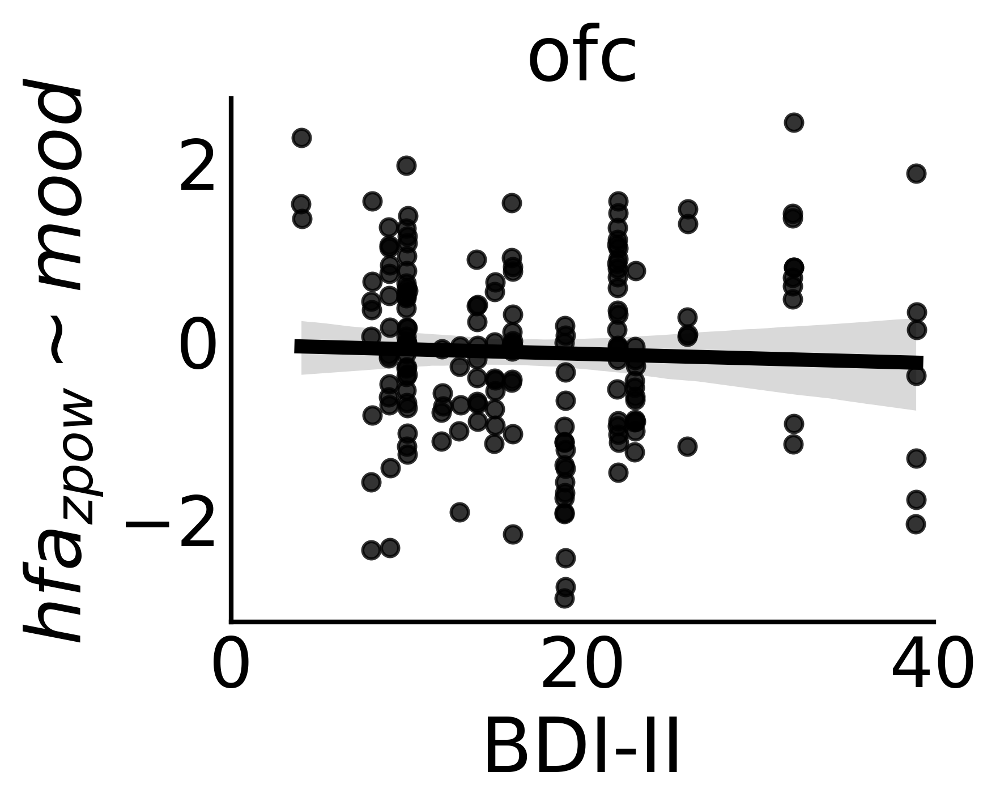

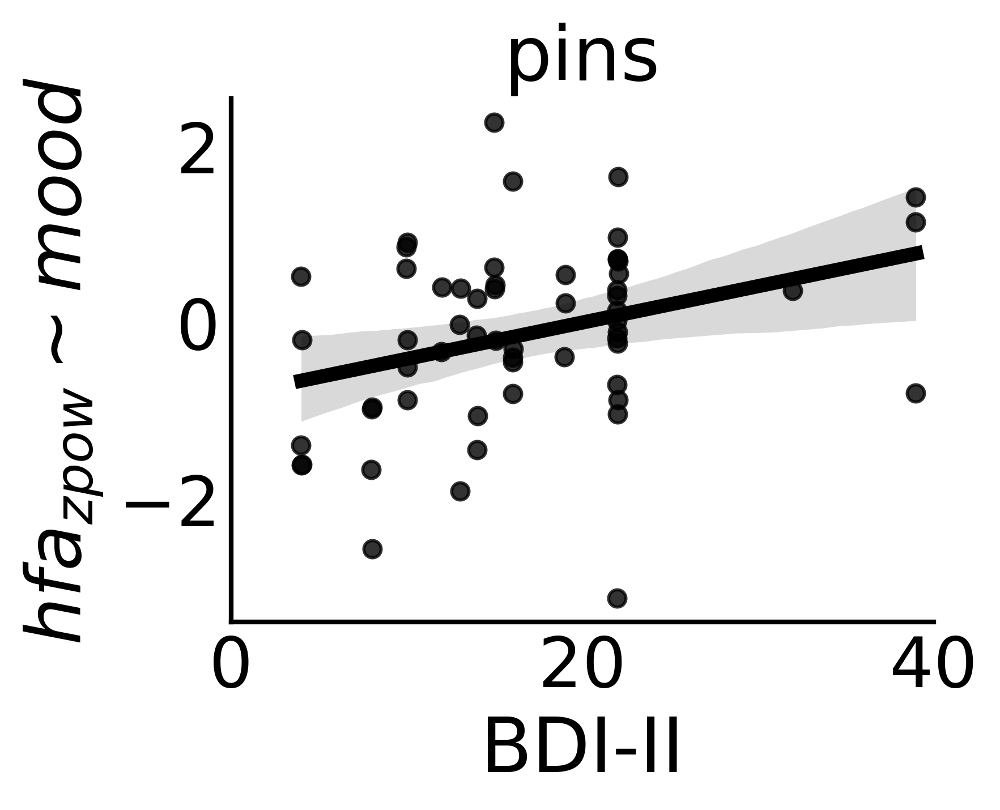

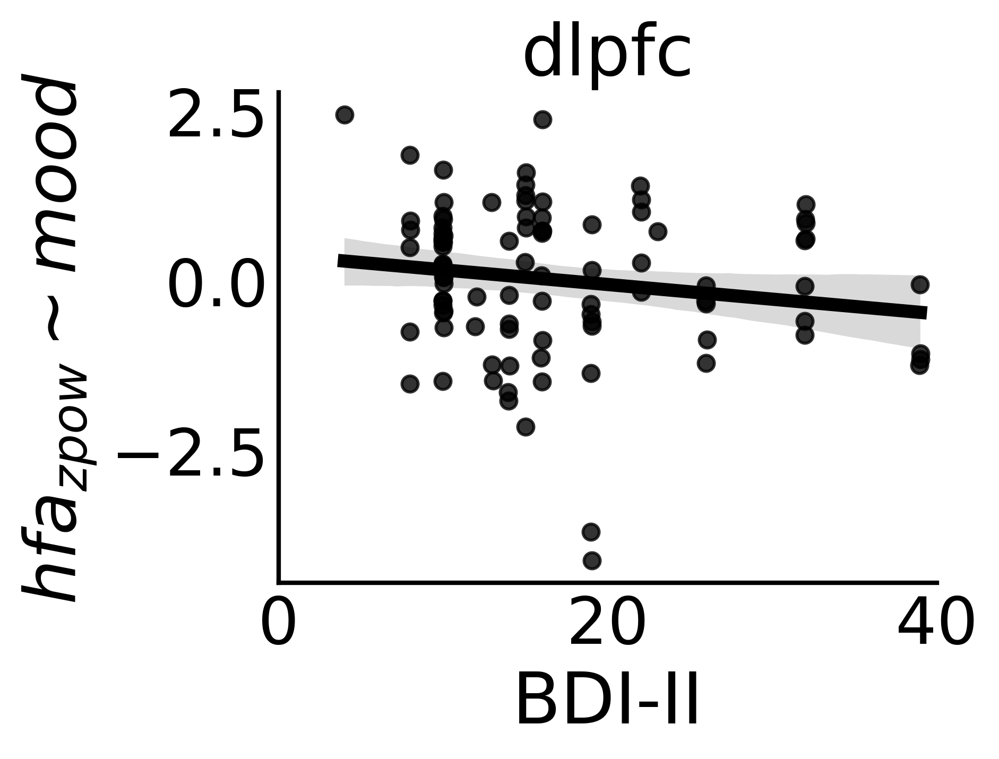

In [32]:

# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_norm_mood',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}} \sim mood$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


### Test BDI Correlations via robust regression

In [33]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_norm_mood.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        22:13:21                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.4302      0.497     33.037     

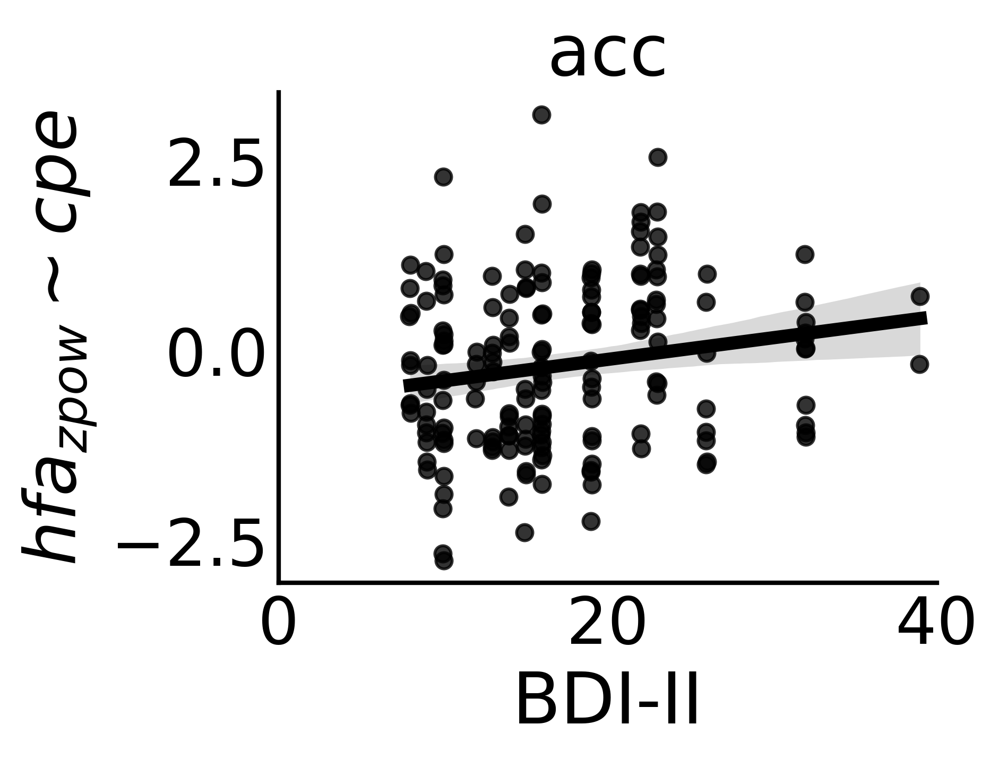

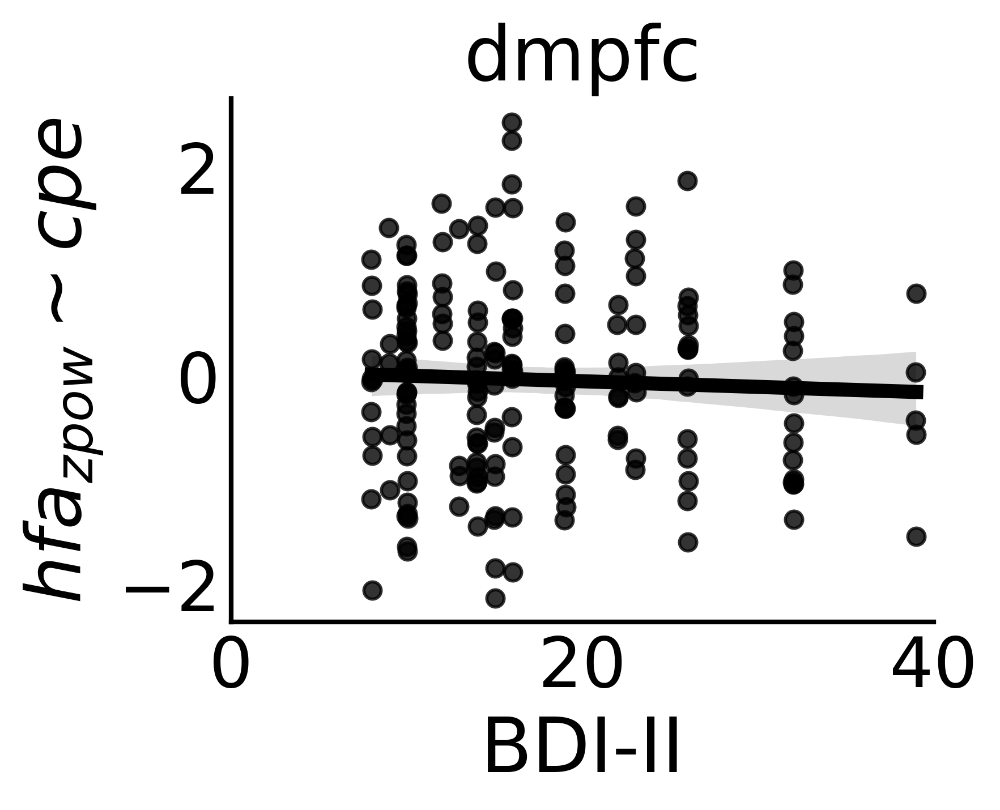

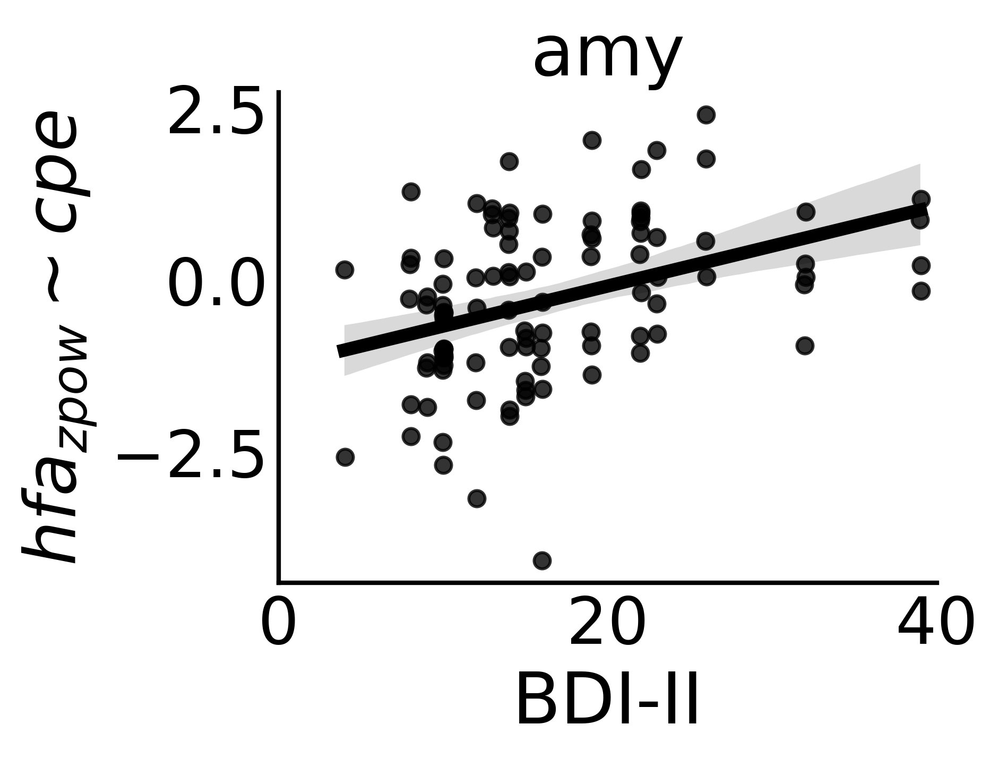

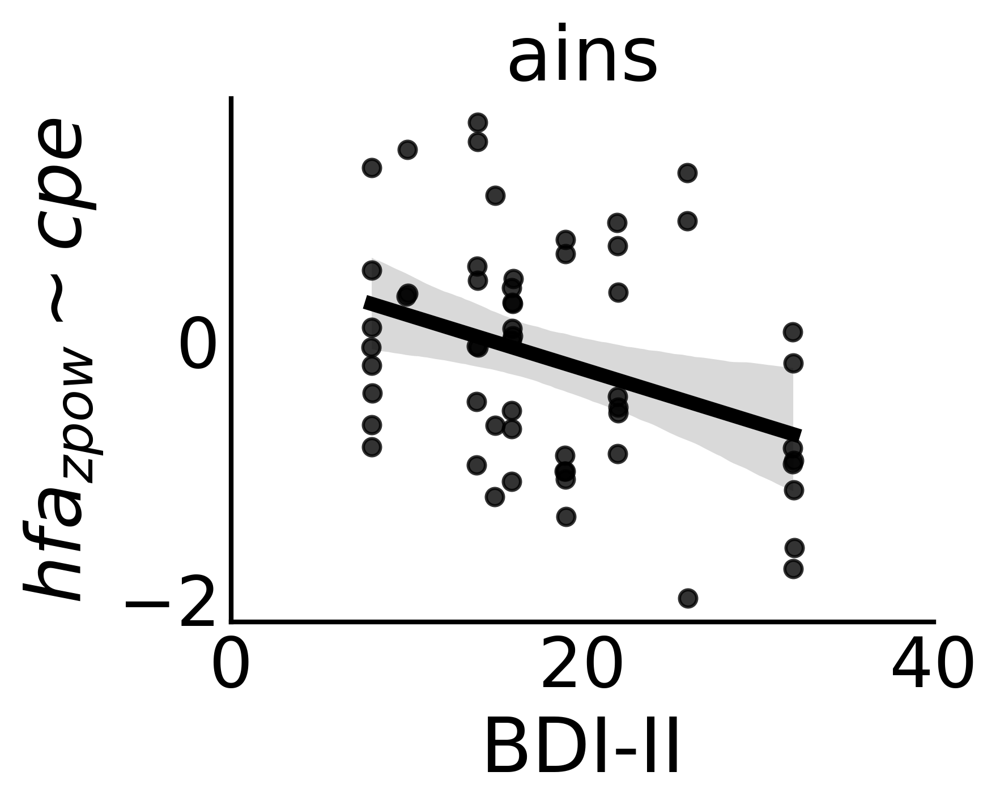

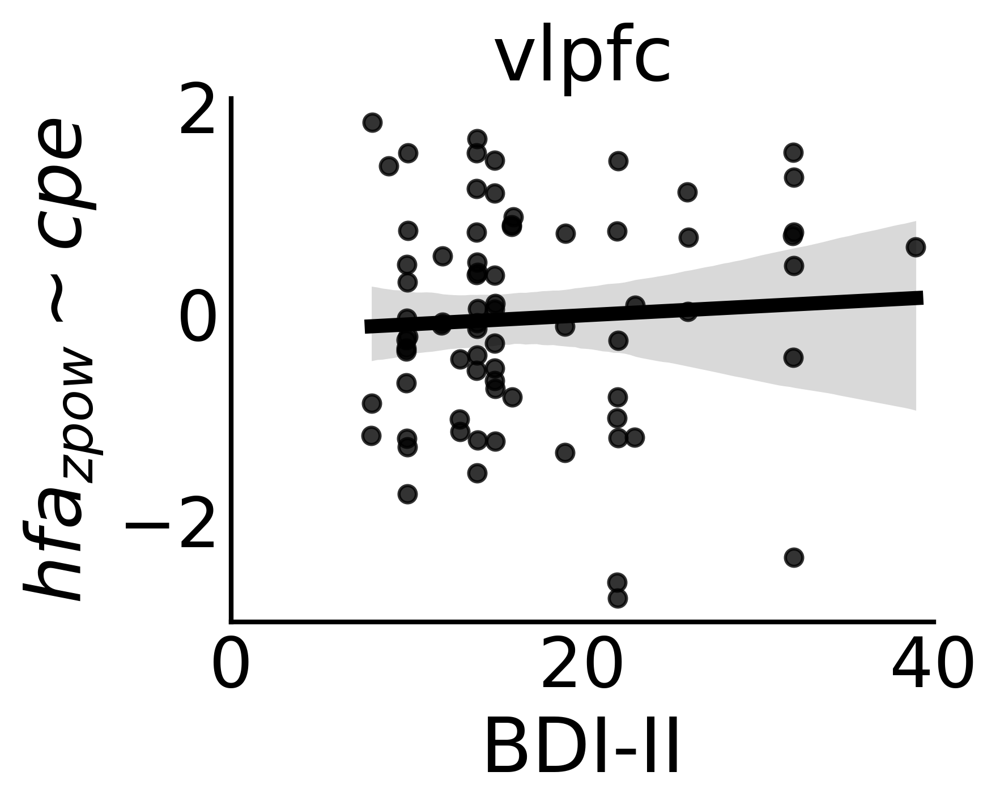

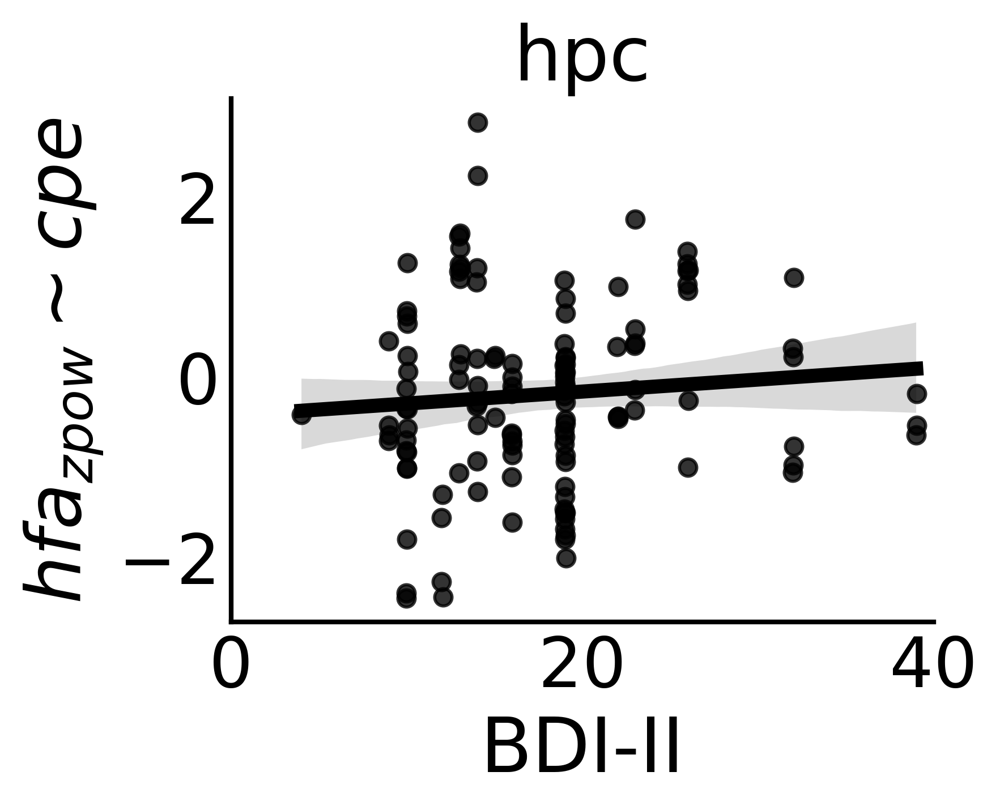

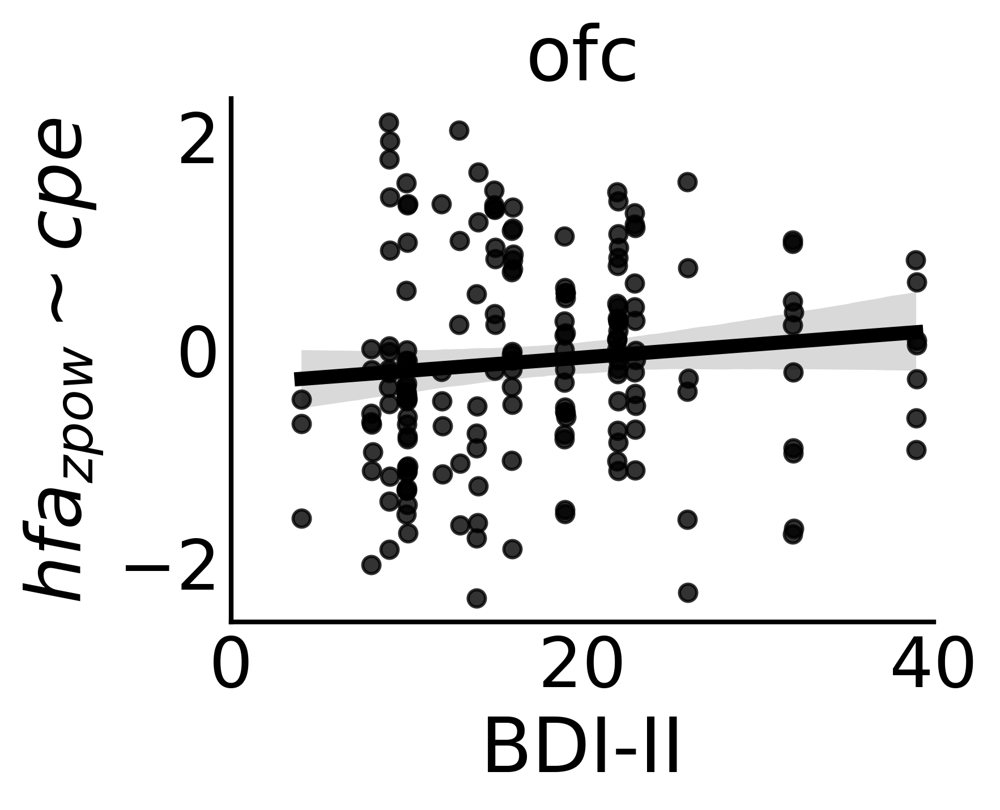

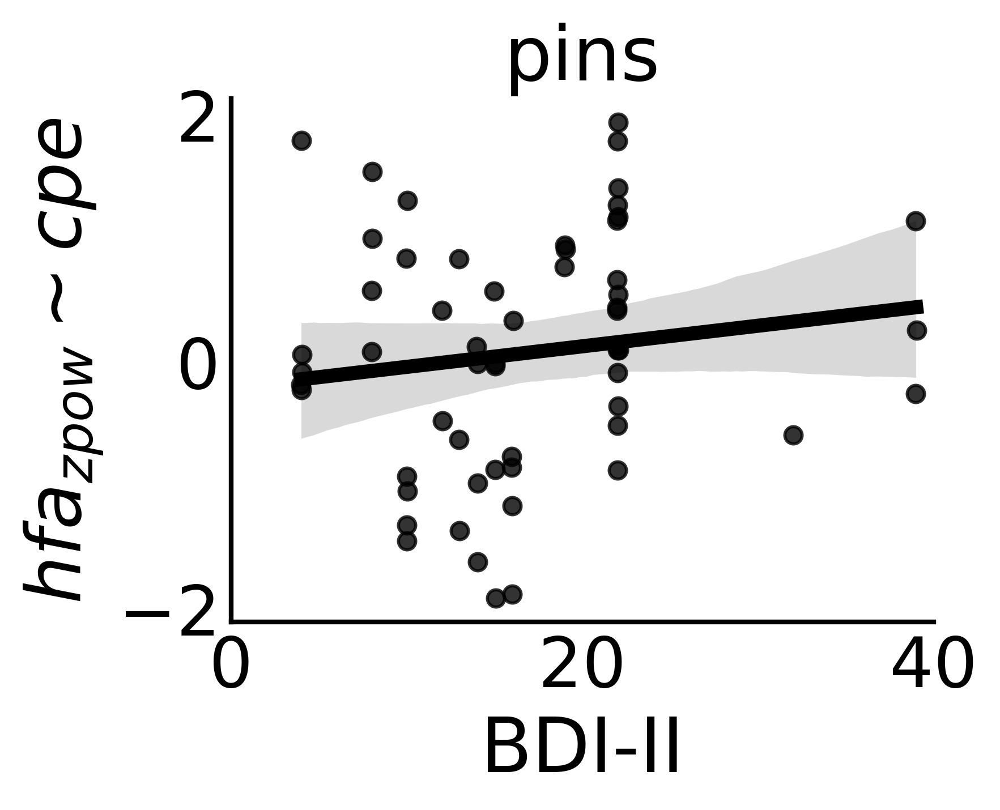

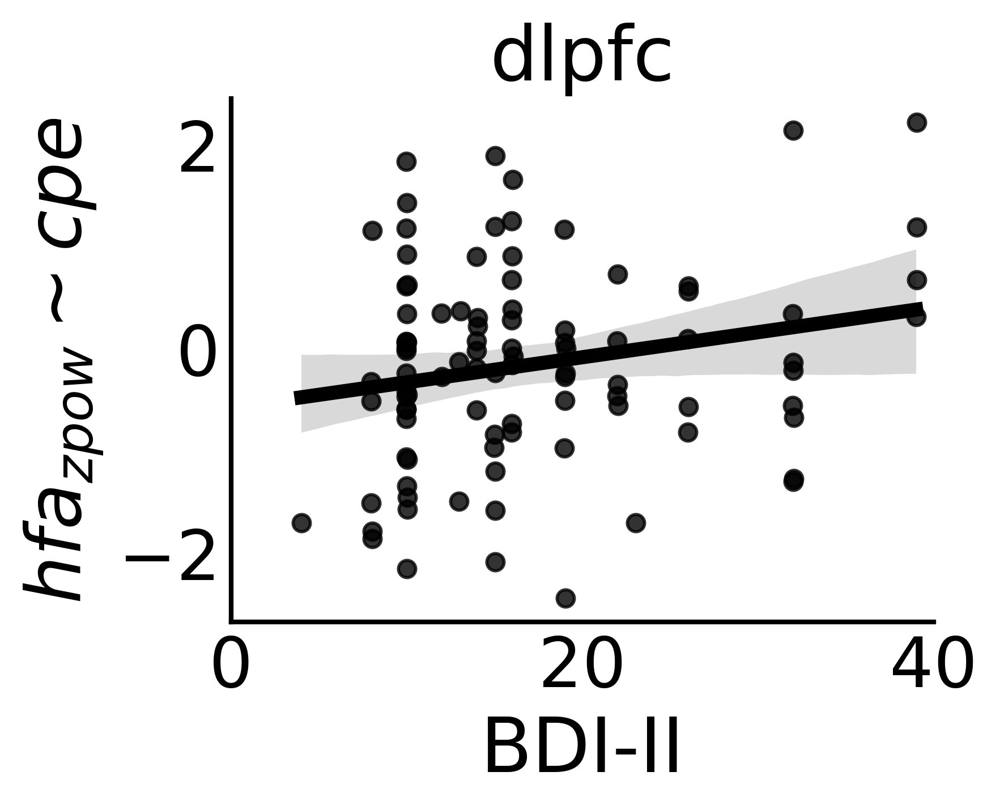

In [34]:
###### CPE CORR 

# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}} \sim cpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [35]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_cpe_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        22:13:25                                         
No. Iterations:                    15                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.6443      0.498     33.449     

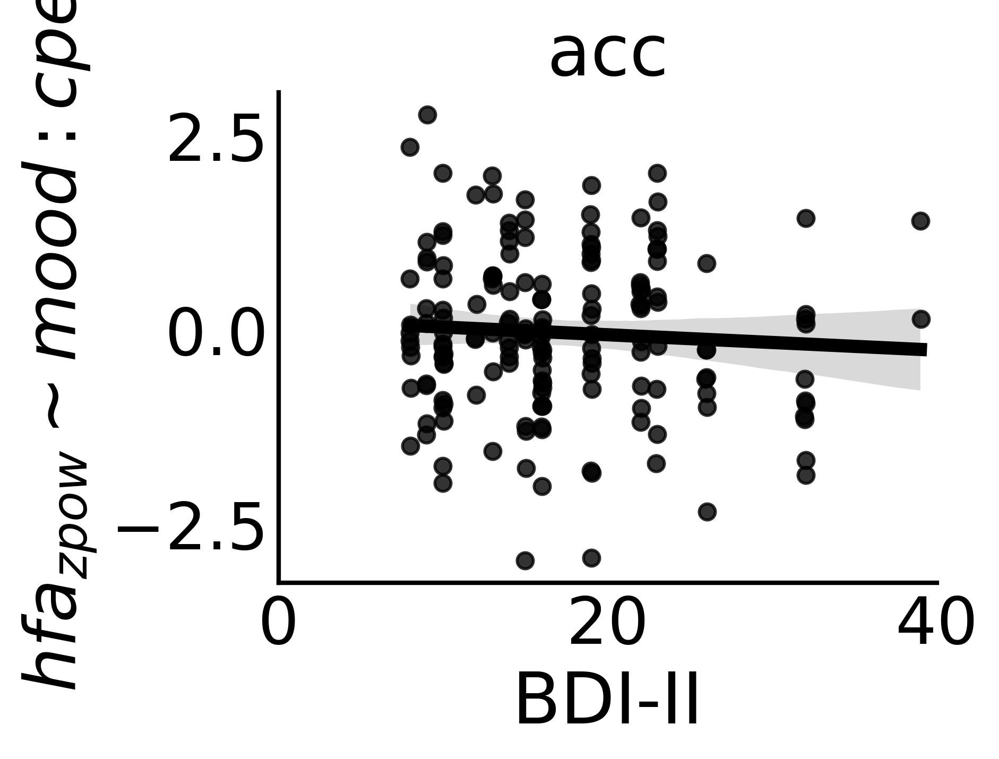

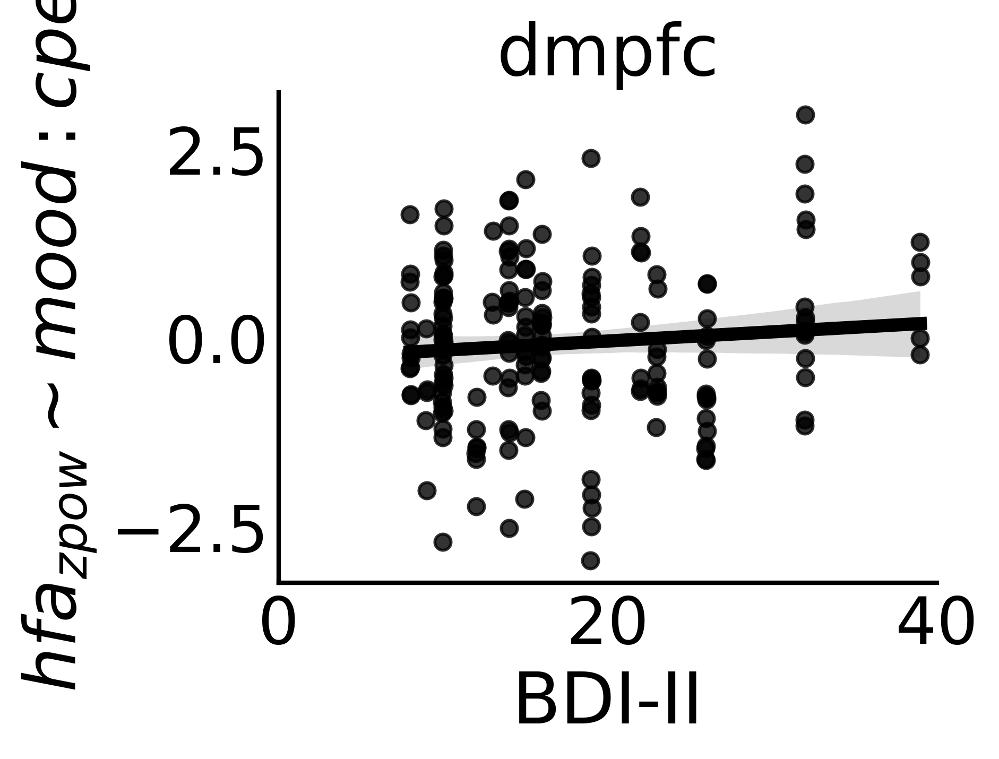

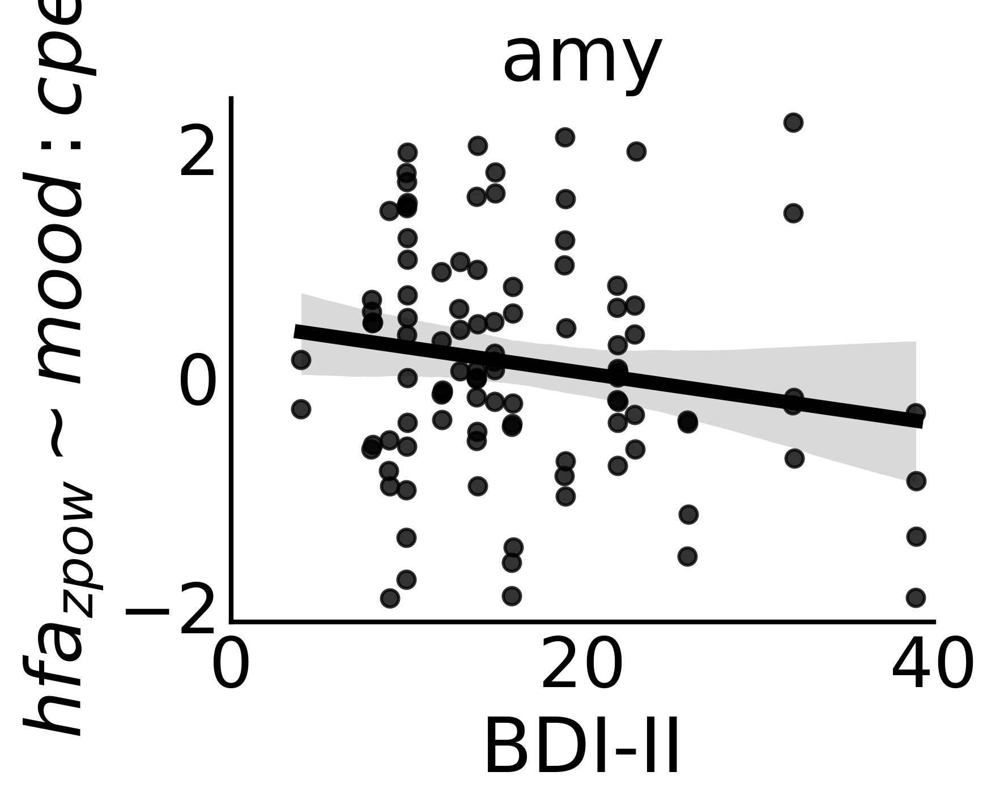

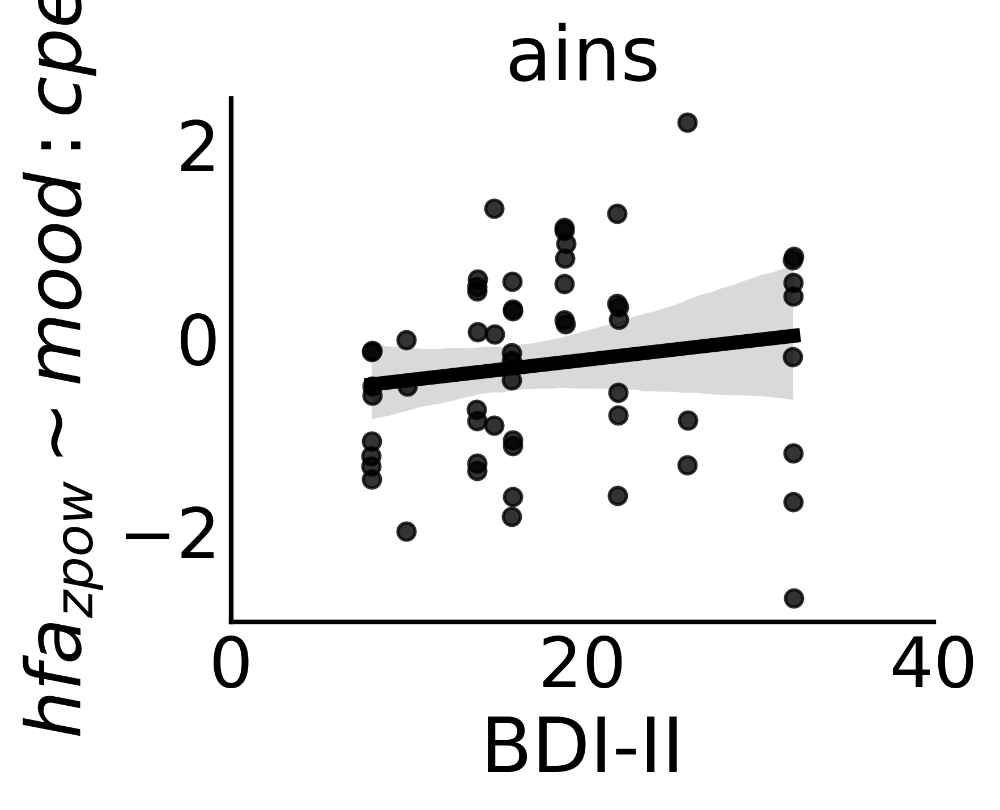

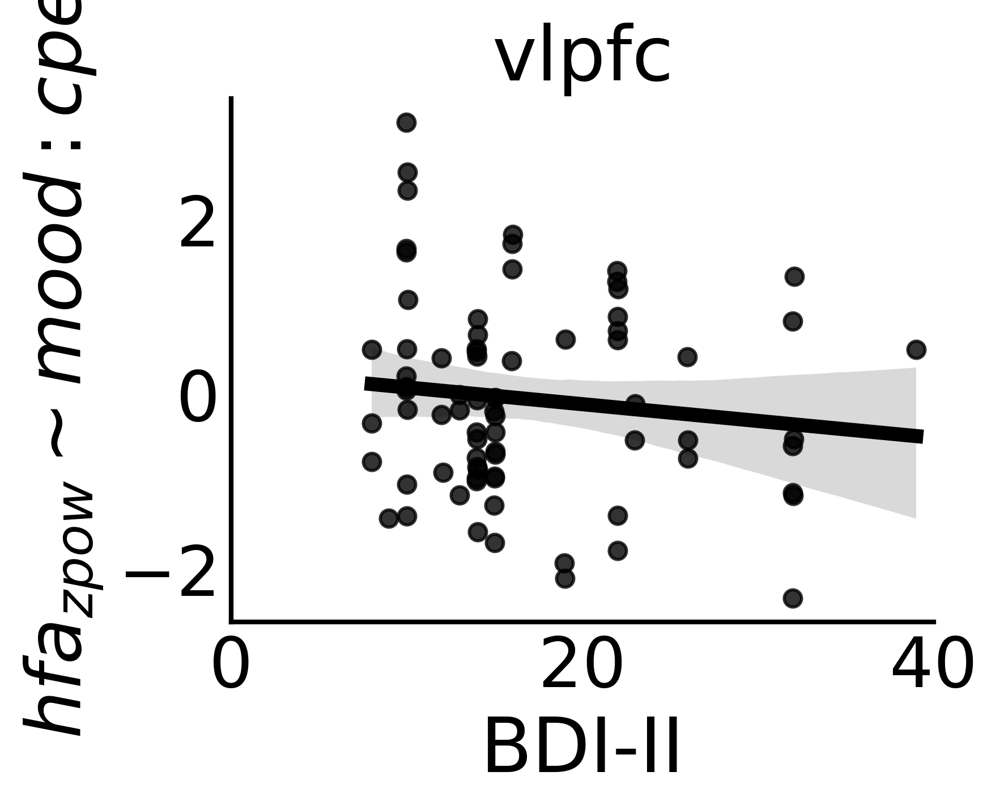

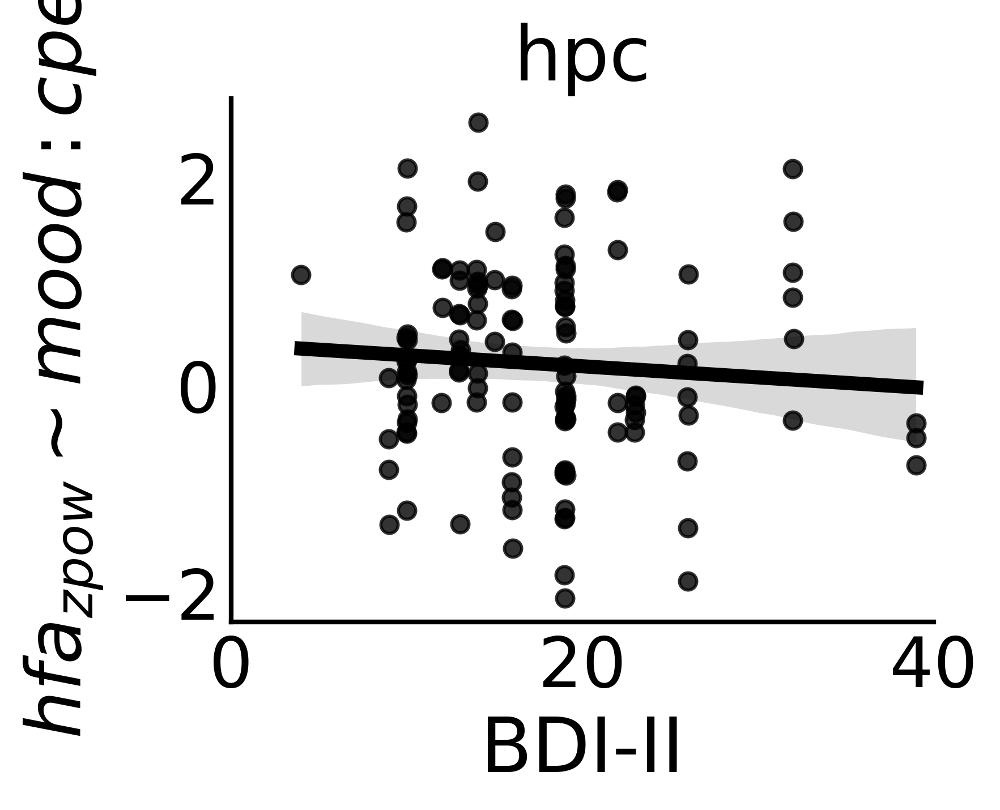

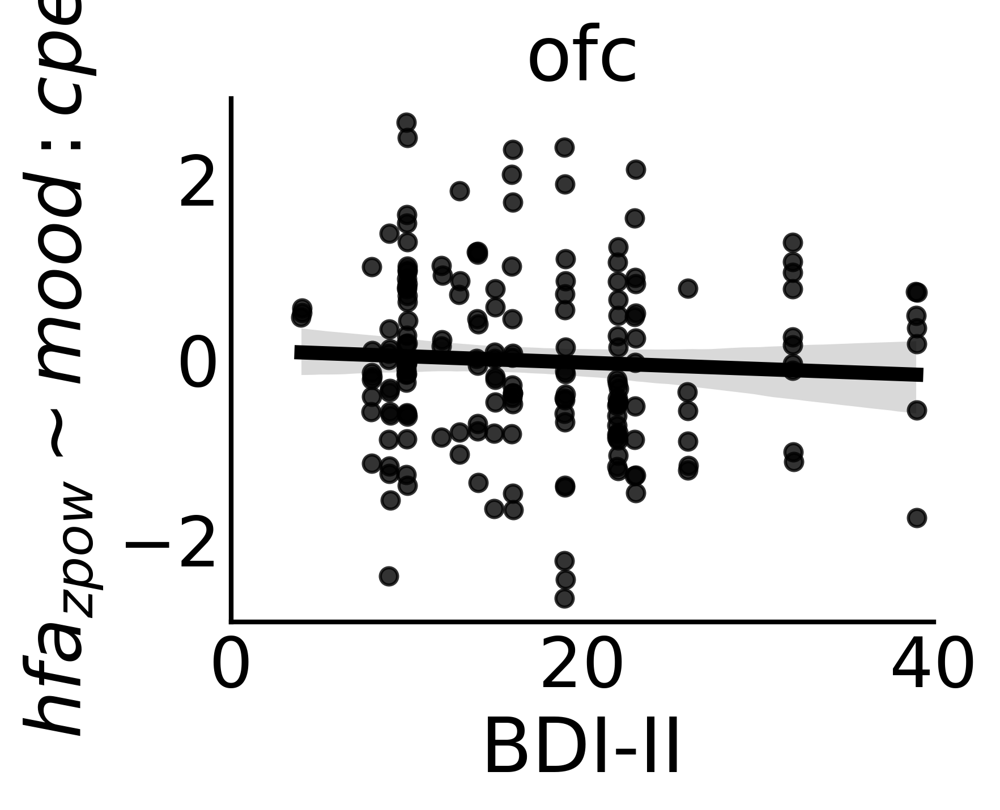

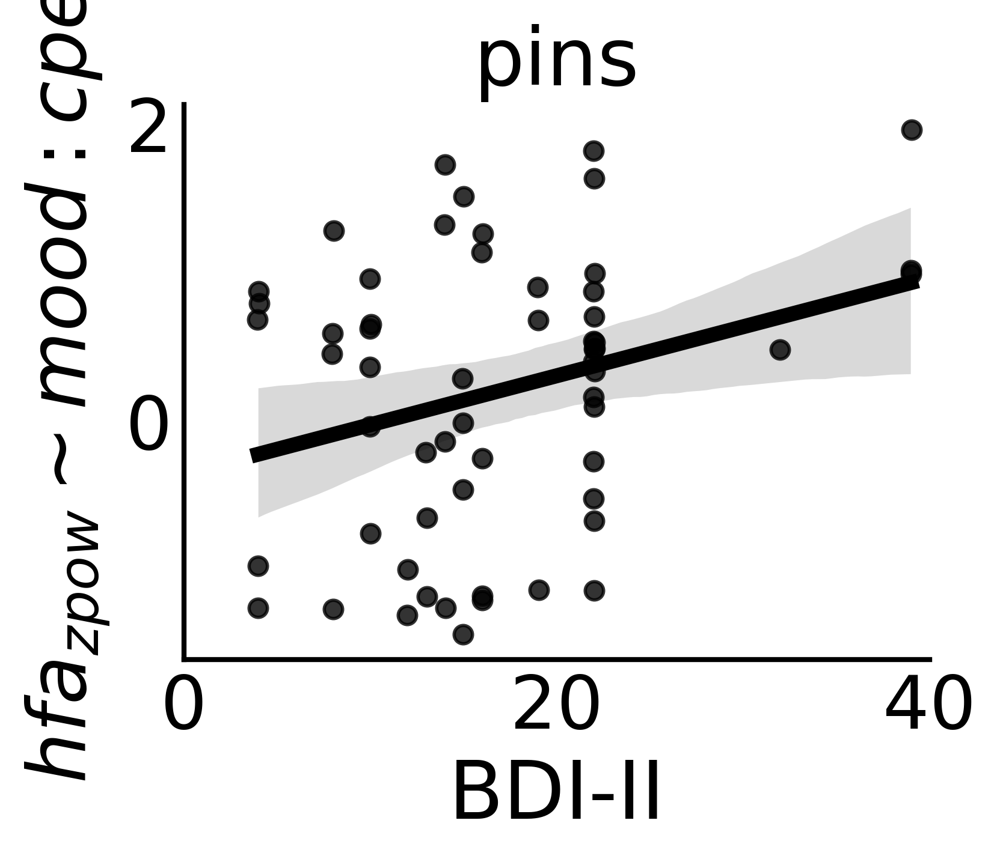

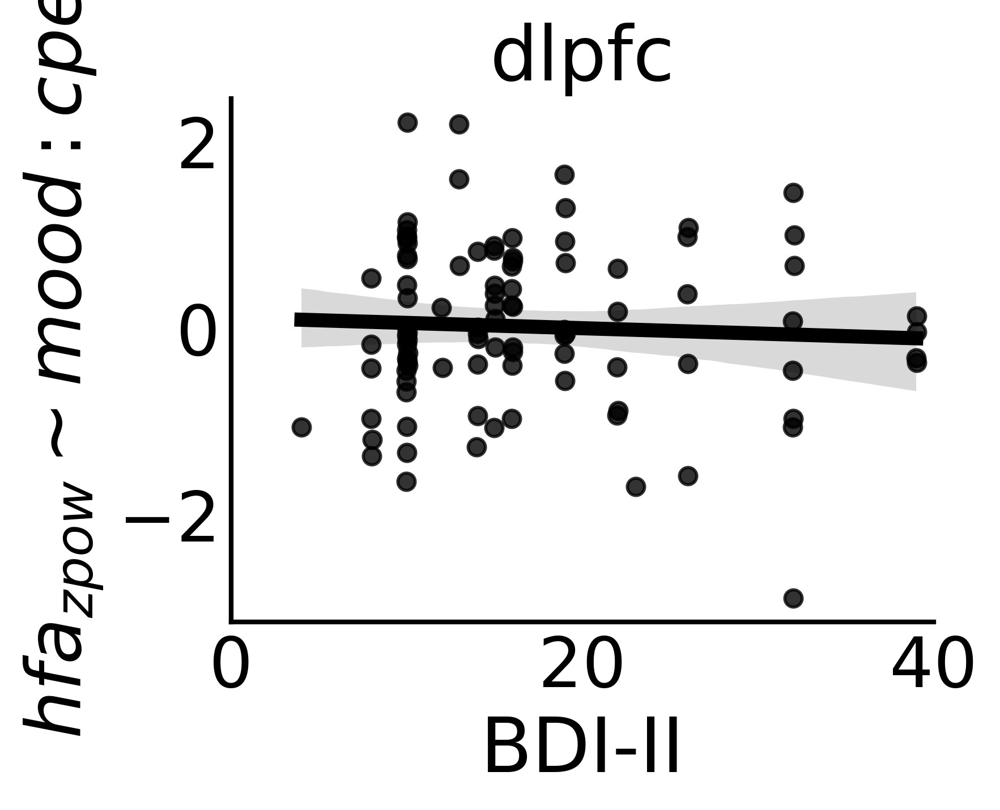

In [36]:
#### INTERACTION CORRS 
# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_mood_cpe_int',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}} \sim mood:cpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [37]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_mood_cpe_int.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())
    
    

acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        22:13:30                                         
No. Iterations:                    10                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.6052      0.494     33.622     

# Run ROI MLMs 

In [38]:
mood_pow_df.columns

Index(['Unnamed: 0', 'epoch', 'time', 'freq', 'reref_ch_names', 'band_pow',
       'band', 'subj_id', 'bdi', 'bdi_thresh', 'Round', 'Rating',
       'RatingOnset', 'RT', 'Round_t1_idx', 'Round_t2_idx', 'Round_t3_idx',
       'epoch_t1_idx', 'epoch_t2_idx', 'epoch_t3_idx', 'norm_mood',
       'MoodChoiceOnset', 'SafeBet_t1', 'SafeBet_t2', 'SafeBet_t3',
       'LowBet_t1', 'LowBet_t2', 'LowBet_t3', 'HighBet_t1', 'HighBet_t2',
       'HighBet_t3', 'Profit_t1', 'Profit_t2', 'Profit_t3', 'TotalProfit_t1',
       'TotalProfit_t2', 'TotalProfit_t3', 'GambleEV_t1', 'GambleEV_t2',
       'GambleEV_t3', 'TrialEV_t1', 'TrialEV_t2', 'TrialEV_t3', 'CR_t1',
       'CR_t2', 'CR_t3', 'choiceEV_t1', 'choiceEV_t2', 'choiceEV_t3', 'rpe_t1',
       'rpe_t2', 'rpe_t3', 'cf_t1', 'cf_t2', 'cf_t3', 'cpe_t1', 'cpe_t2',
       'cpe_t3', 'mood_epoch_len', 'next_round_start', 'roi', 'hemi',
       'unique_reref_ch', 'mood_cpe_int'],
      dtype='object')

In [39]:
outcome_var  = 'band_pow'
rand_eff_var = 'unique_reref_ch'
# reg_vars     = ['norm_mood','rpe_t1','Profit_t1', 'cpe_t1']
# rand_vars    = ['norm_mood','rpe_t1','Profit_t1', 'cpe_t1']
reg_vars     = ['norm_mood','cpe_t1','norm_mood:cpe_t1']
rand_vars    = ['norm_mood','cpe_t1','norm_mood:cpe_t1']


In [40]:
fit_dict = {f'{roi}':fit_mixed_model(mood_pow_df[mood_pow_df.roi==roi],
                                        reg_vars,rand_vars,outcome_var,rand_eff_var) 
                for roi in mood_pow_df.roi.unique().tolist()}

In [41]:
fit_dict

{'acc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2adbce7042c0>,
 'dmpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2adbce78a0f0>,
 'amy': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2adbce13eab0>,
 'ains': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2adbce73e9f0>,
 'vlpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2adbcdcf9d60>,
 'hpc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2adbcdffa360>,
 'ofc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2adbce2e1820>,
 'pins': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2adbce236420>,
 'dlpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2adbce75f740>}

In [43]:
fit_results = []

for roi in list(fit_dict.keys()):
    roi_fit = mixed_eff_results_df(fit_dict[roi],mood_pow_df[mood_pow_df.roi==roi],
                                    rand_eff_var=rand_eff_var,region_type='roi')
    fit_results.append(roi_fit)
    
fit_results = pd.concat(fit_results).reset_index(drop=True)
fit_results['band'] = 'hfa'
# fit_results.to_csv(f'{save_dir}beta_coh_mlm_roi_fit_results_{date}.csv')

In [44]:
fit_results

,unique_reref_ch,subj_id,region_type,bdi,raw_Intercept,raw_norm_mood,raw_cpe_t1,raw_norm_mood:cpe_t1,Intercept,norm_mood,cpe_t1,norm_mood:cpe_t1,band
0,DA023_lac1-lac2,DA023,acc,14,0.026897,-0.065803,-0.005964,0.023247,0.031454,-0.071910,-0.013375,0.019867,hfa
1,DA023_lac2-lac3,DA023,acc,14,0.018940,-0.046410,-0.030404,0.012743,0.023497,-0.052517,-0.037815,0.009363,hfa
2,DA023_lac3-lac4,DA023,acc,14,0.025547,-0.043184,-0.009736,0.018331,0.030103,-0.049291,-0.017146,0.014951,hfa
3,MS002_lacas1-lacas2,MS002,acc,14,-0.013521,0.032141,0.019952,-0.002922,-0.008965,0.026034,0.012542,-0.006301,hfa
4,MS002_lacas2-lacas3,MS002,acc,14,-0.020940,0.025690,0.020868,-0.006227,-0.016384,0.019582,0.013458,-0.009607,hfa
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,MS048_lacas8-lacas9,MS048,dlpfc,19,0.003923,0.008481,-0.004761,0.006072,0.004268,0.005826,-0.008065,0.009347,hfa
1046,MS048_lacas9-lacas10,MS048,dlpfc,19,0.006193,-0.008687,0.004935,0.005591,0.006538,-0.011342,0.001632,0.008866,hfa
1047,MS048_racas10-racas11,MS048,dlpfc,19,-0.001837,-0.021258,0.003125,0.006006,-0.001492,-0.023913,-0.000179,0.009282,hfa
1048,MS048_racas11-racas12,MS048,dlpfc,19,0.016887,-0.009199,0.009340,0.019791,0.017232,-0.011855,0.006036,0.023066,hfa


In [45]:
# roi_fit_results

fe_params_results = {f'{roi}':fit_dict[roi].fe_params for roi in list(fit_dict.keys())}
fe_results = []
for fe_res in fe_params_results:
    fe_results.append(pd.DataFrame({**dict(fe_params_results[fe_res]),**{'roi':fe_res}},index=[0]))
    
fe_results = pd.concat(fe_results).reset_index(drop=True)
fe_results['mood_pval'] = [np.round(fit_dict[roi].pvalues['norm_mood'],4) for roi in fe_results.roi.tolist()]
fe_results['cpe_pval'] = [np.round(fit_dict[roi].pvalues['cpe_t1'],4) for roi in fe_results.roi.tolist()]
fe_results['mood-cpe_pval'] = [np.round(fit_dict[roi].pvalues['norm_mood:cpe_t1'],4) for roi in fe_results.roi.tolist()]

fe_results


,Intercept,norm_mood,cpe_t1,norm_mood:cpe_t1,roi,mood_pval,cpe_pval,mood-cpe_pval
0,0.004556,-0.006107,-0.007411,-0.003379,acc,0.1783,0.1198,0.5665
1,0.006923,-0.004817,-0.005989,-0.007103,dmpfc,0.1445,0.0944,0.3262
2,-0.006163,-0.004063,-0.006412,-0.003196,amy,0.3047,0.1157,0.7266
3,0.021606,-0.009947,-0.001908,-0.022083,ains,0.0571,0.7359,0.0271
4,0.002724,-0.002993,0.007622,-0.005538,vlpfc,0.5952,0.2121,0.6807
5,-0.011101,-0.000988,-0.004796,0.009630,hpc,0.8080,0.2369,0.3043
6,-0.011251,-0.005258,-0.005250,-0.002027,ofc,0.1269,0.1273,0.7756
7,0.002723,-0.008241,0.002688,0.020098,pins,0.2004,0.6629,0.1182
8,0.000345,-0.002656,-0.003303,0.003276,dlpfc,0.6251,0.5297,0.7214


In [46]:
fe_results.set_index('roi')

,Intercept,norm_mood,cpe_t1,norm_mood:cpe_t1,mood_pval,cpe_pval,mood-cpe_pval
roi,,,,,,,
acc,0.004556,-0.006107,-0.007411,-0.003379,0.1783,0.1198,0.5665
dmpfc,0.006923,-0.004817,-0.005989,-0.007103,0.1445,0.0944,0.3262
amy,-0.006163,-0.004063,-0.006412,-0.003196,0.3047,0.1157,0.7266
ains,0.021606,-0.009947,-0.001908,-0.022083,0.0571,0.7359,0.0271
vlpfc,0.002724,-0.002993,0.007622,-0.005538,0.5952,0.2121,0.6807
hpc,-0.011101,-0.000988,-0.004796,0.009630,0.8080,0.2369,0.3043
ofc,-0.011251,-0.005258,-0.005250,-0.002027,0.1269,0.1273,0.7756
pins,0.002723,-0.008241,0.002688,0.020098,0.2004,0.6629,0.1182
dlpfc,0.000345,-0.002656,-0.003303,0.003276,0.6251,0.5297,0.7214


In [47]:
bonferr_alpha = 0.05/len(fe_results)
# bonferr_alpha = 0.01

bonferr_alpha



0.005555555555555556

In [48]:
# sig_cpe_rois = fe_results.roi[fe_results.cpe_pval <= bonferr_alpha].tolist()
# sig_cpe_rois

sig_mood_rois = fe_results.roi[fe_results.mood_pval <= bonferr_alpha].tolist()
sig_mood_rois



[]

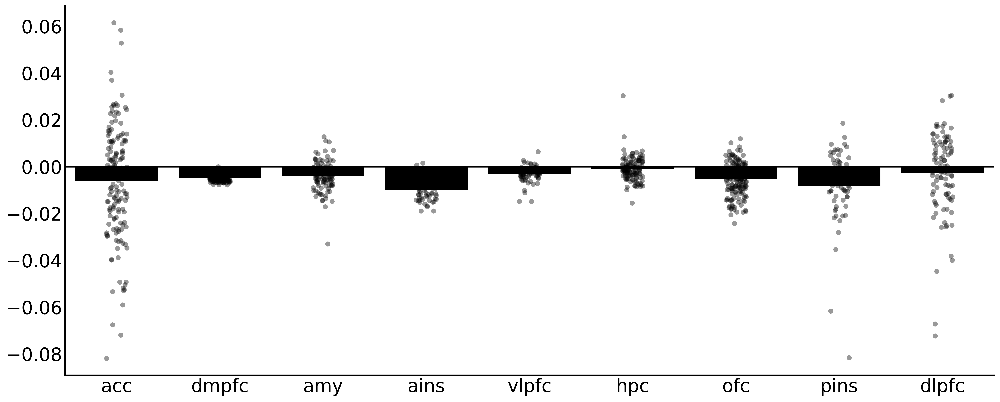

In [49]:
plot_roi_model_results(fit_results,'region_type','norm_mood',figsize=(20,8),dpi=400)

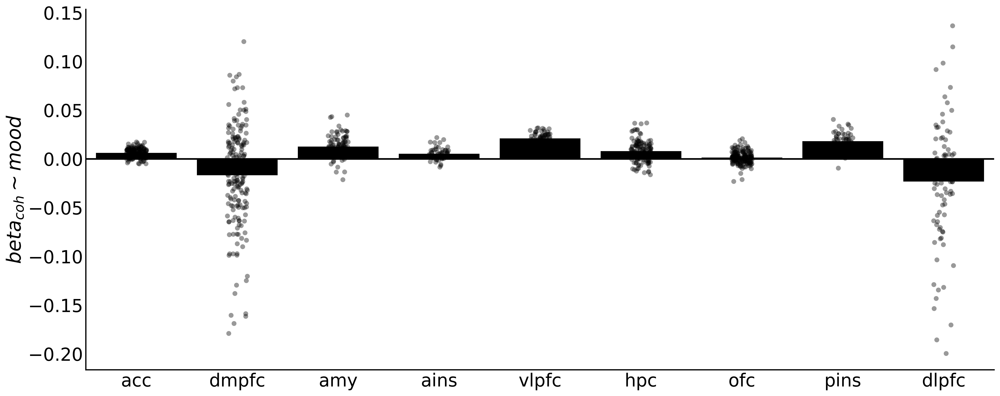

In [31]:
# ylabel = fr'${band}_{{coh}} \sim mood$'
# # fig_save_dir = '/sc/arion/projects/guLab/Alie/SWB/ephys_analysis/results/single-electrode-regressions/'
# fig_id = f'{band}_beta_mood_mlm_barplot.pdf'


# plot_roi_model_results(fit_results,'region_type','norm_mood',figsize=(20,8),color='k',
#                        ylabel=ylabel,save_fig=True,save_dir=save_dir,fig_id=fig_id,dpi=400)


# # plot_roi_model_results(fit_results,'region_type','cpe',bar_order = plot_pairs,figsize=(12,4),color='k')



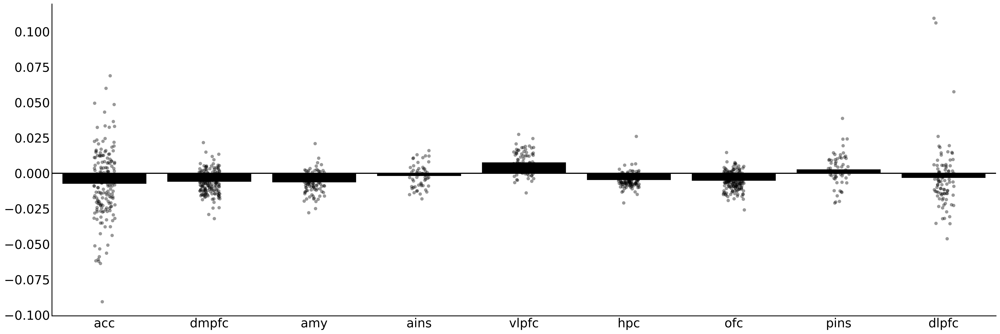

In [50]:
plot_roi_model_results(fit_results,'region_type','cpe_t1',figsize=(30,10),color='k')


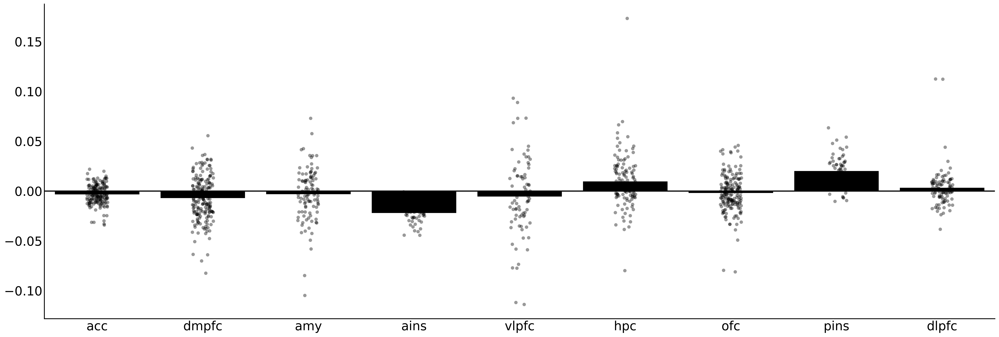

In [51]:
plot_roi_model_results(fit_results,'region_type','norm_mood:cpe_t1',figsize=(30,10),color='k')


# Mood Weights BDI Correlation

In [52]:
# CHECK BDI CORRELATION

rho_data = []
sig_rho = []

# BDI CORRELATIONS
for roi in fit_results.region_type.unique().tolist():
    temp_data = fit_results[fit_results.region_type==roi]
    rho,rho_p     = pearsonr(temp_data.bdi,temp_data.norm_mood)
#     rho,rho_p     = pearsonr(roi_temp_data.bdi,roi_temp_data.elec_bCPE)
#     print(f'{roi} pearsonr',rho,rho_p)
    rho_data.append(pd.DataFrame({'roi':roi,'rho':rho,'rho_p':rho_p},index=[0]))
#     if rho_p <= bonferr_alpha:
#         sig_bdi_rois.append(roi)
#     if rho_p < bonferr_alpha:
    if rho_p < 0.05:
        sig_rho.append((roi,rho,rho_p))
    print(f'{roi} pearsonr',rho,rho_p)
rho_data = pd.concat(rho_data).reset_index(drop=True)


acc pearsonr -0.09169360926464376 0.23858655289723585
dmpfc pearsonr 0.1499259562474962 0.03742613016592966
amy pearsonr -0.25480153586519305 0.009753145726888823
ains pearsonr 0.06876712771197908 0.611256593115884
vlpfc pearsonr 0.0855680101116916 0.46543019718583395
hpc pearsonr -0.026332168423682963 0.7715842217961121
ofc pearsonr -0.013042154770939687 0.8624336596252977
pins pearsonr 0.4575137535205219 0.0003053021259255958
dlpfc pearsonr -0.15281741959090814 0.13928451965277247


In [53]:
sig_rho

[('dmpfc', 0.1499259562474962, 0.03742613016592966),
 ('amy', -0.25480153586519305, 0.009753145726888823),
 ('pins', 0.4575137535205219, 0.0003053021259255958)]

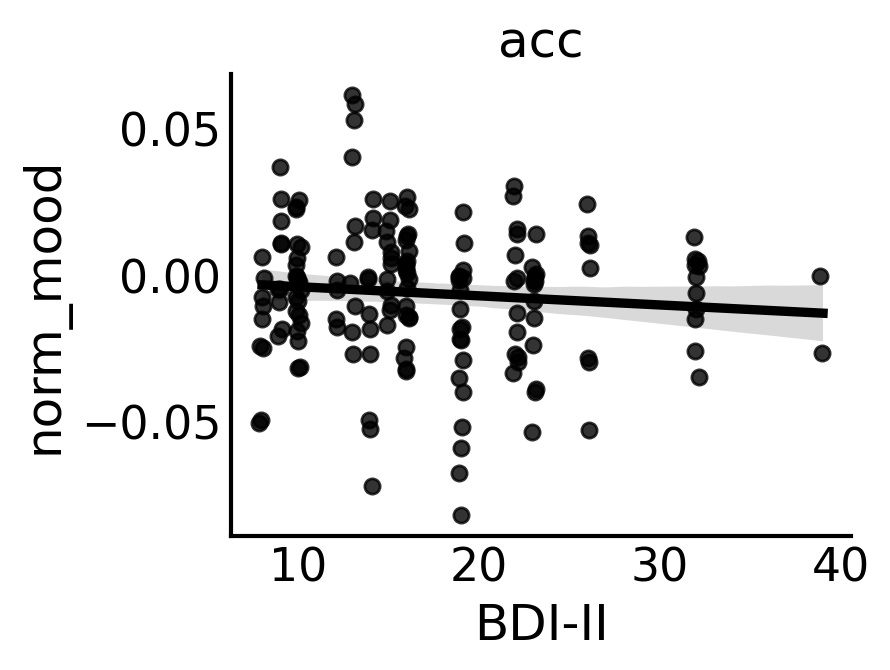

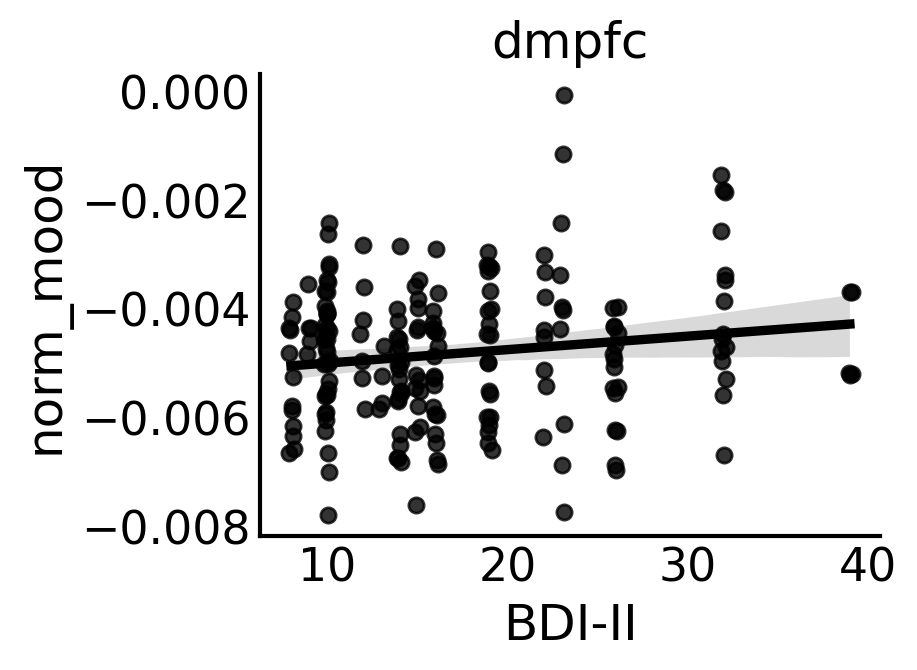

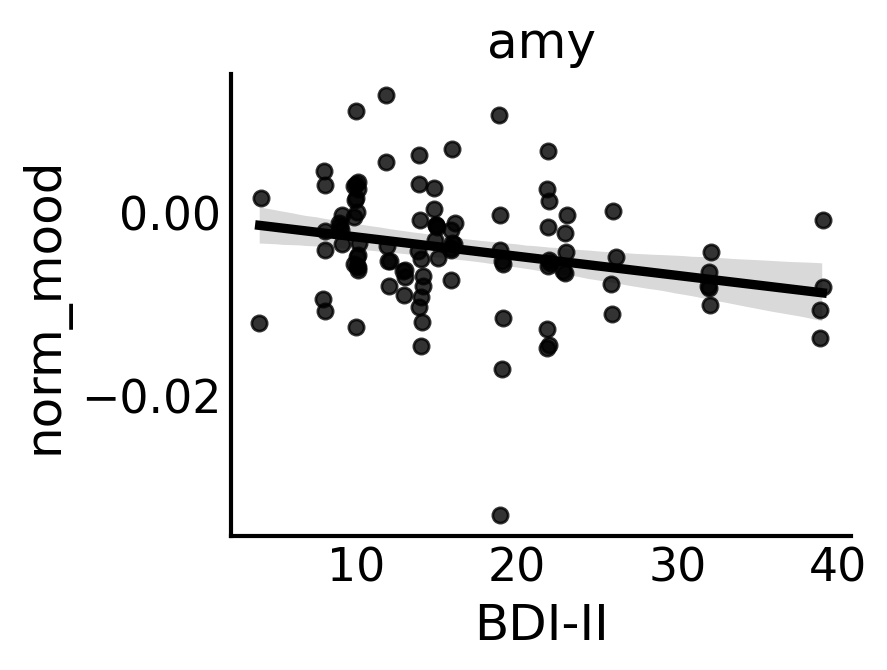

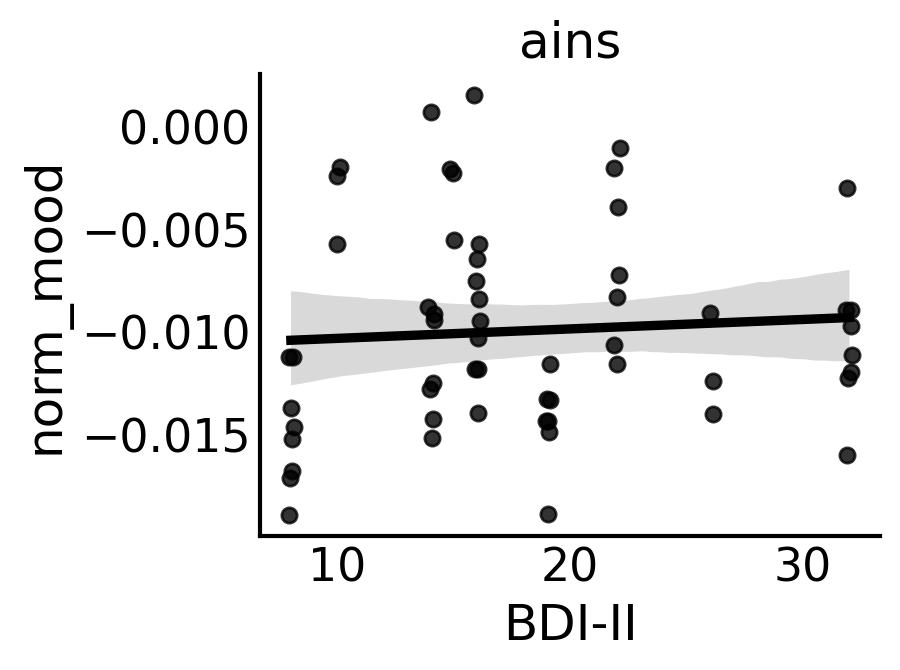

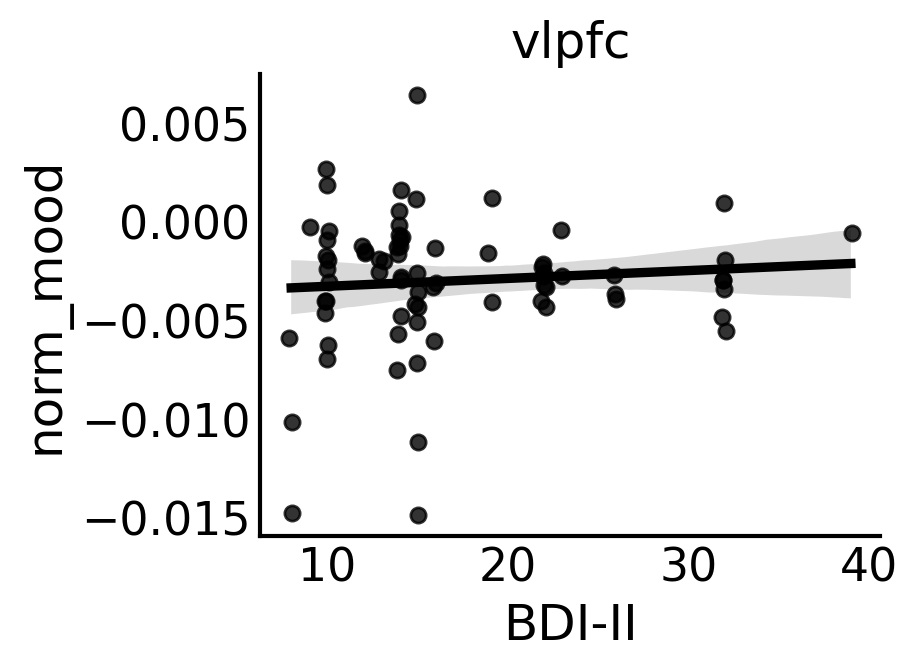

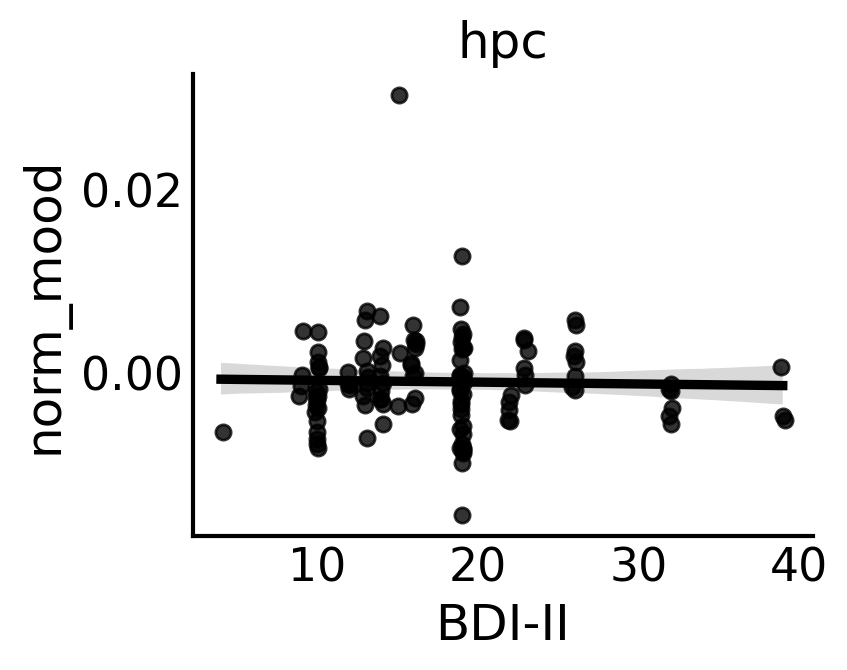

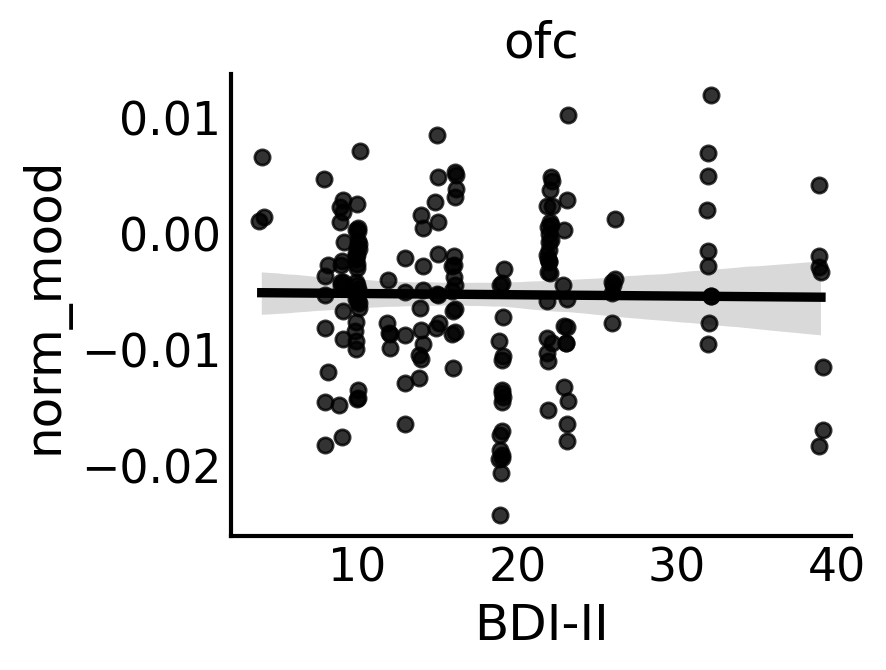

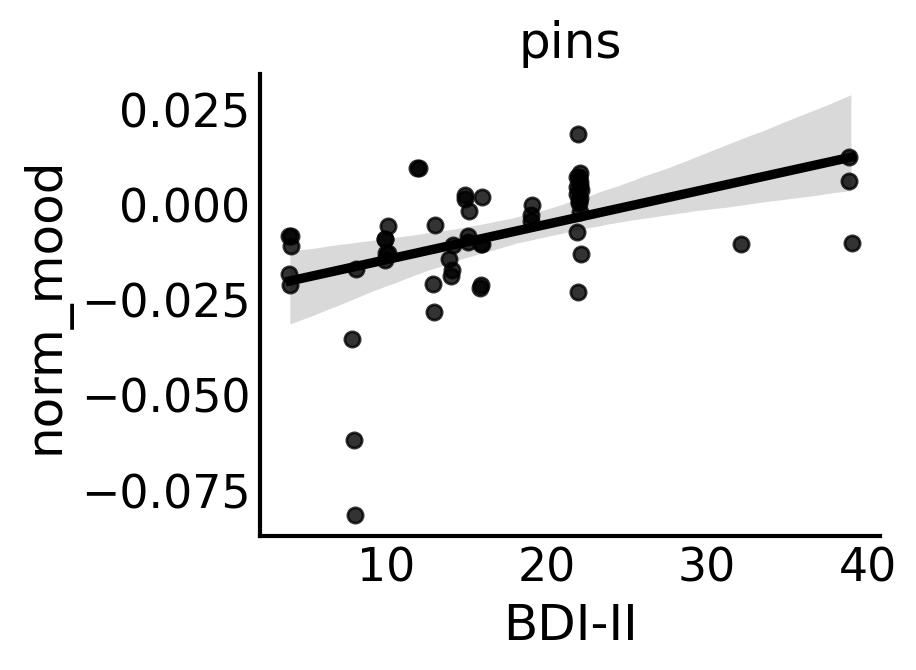

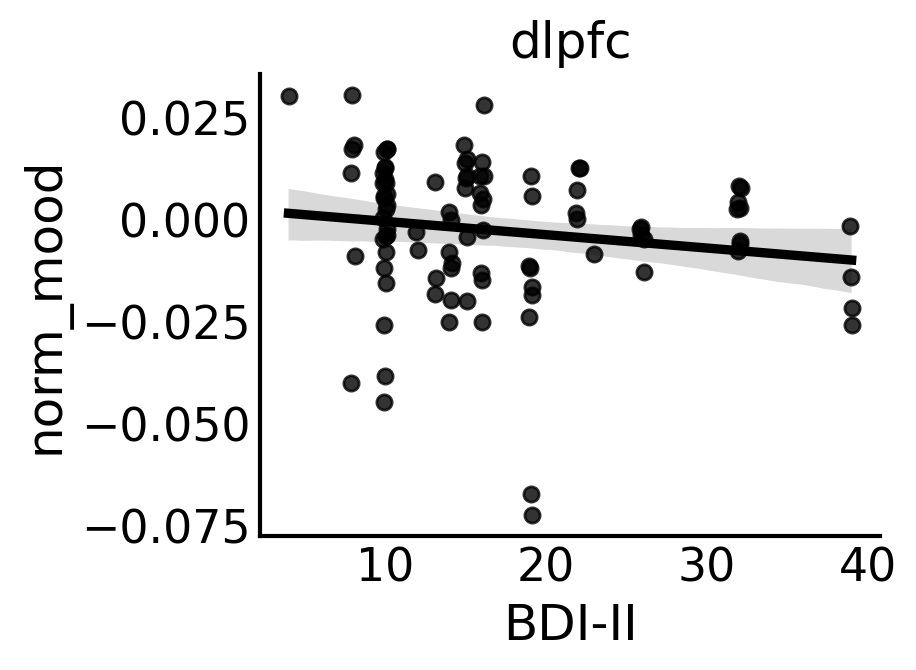

In [54]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='norm_mood',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [55]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df.norm_mood.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        22:17:22                                         
No. Iterations:                    10                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.3855      0.511     32.094     

# CPE Weights BDI Correlation

In [56]:
# CHECK BDI CORRELATION

rho_data = []
sig_rho = []

# BDI CORRELATIONS
for roi in fit_results.region_type.unique().tolist():
    temp_data = fit_results[fit_results.region_type==roi]
    rho,rho_p     = pearsonr(temp_data.bdi,temp_data.cpe_t1)
    rho_data.append(pd.DataFrame({'roi':roi,'rho':rho,'rho_p':rho_p},index=[0]))

    if rho_p < 0.05:
        sig_rho.append((roi,rho,rho_p))
    print(f'{roi} pearsonr',rho,rho_p)
rho_data = pd.concat(rho_data).reset_index(drop=True)


acc pearsonr 0.20288866820062576 0.008548192195167973
dmpfc pearsonr 0.1090955673361839 0.1309745463924035
amy pearsonr 0.3453601267176951 0.00037795279344010336
ains pearsonr -0.22180252634296732 0.09727741046082701
vlpfc pearsonr 0.15828531779874688 0.174992546677945
hpc pearsonr 0.028893314011316902 0.7500675182815987
ofc pearsonr 0.07049380400836038 0.34839729864520663
pins pearsonr 0.1917671486257022 0.14927832014128603
dlpfc pearsonr 0.12413600088426782 0.23070180376337204


In [57]:
sig_rho

[('acc', 0.20288866820062576, 0.008548192195167973),
 ('amy', 0.3453601267176951, 0.00037795279344010336)]

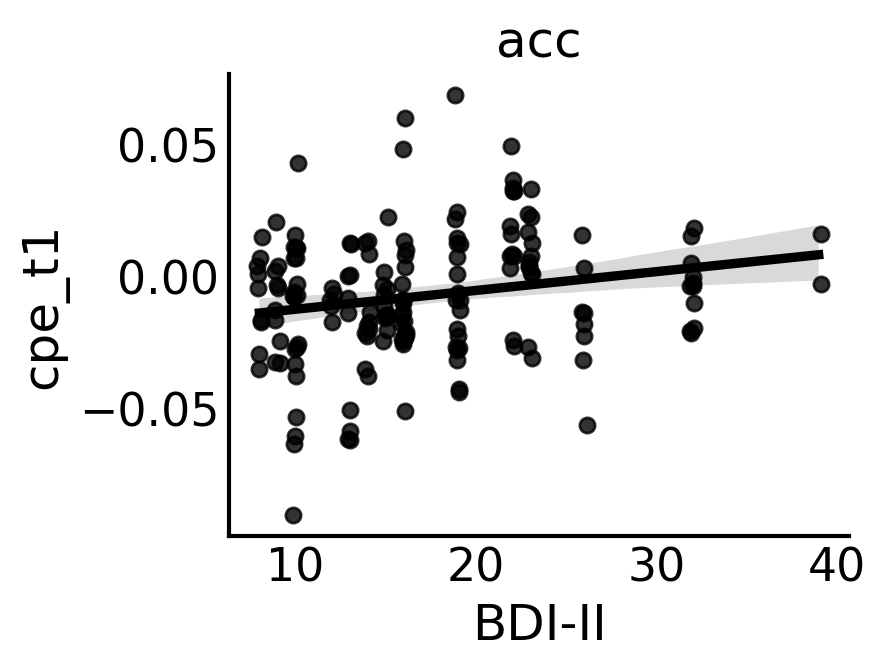

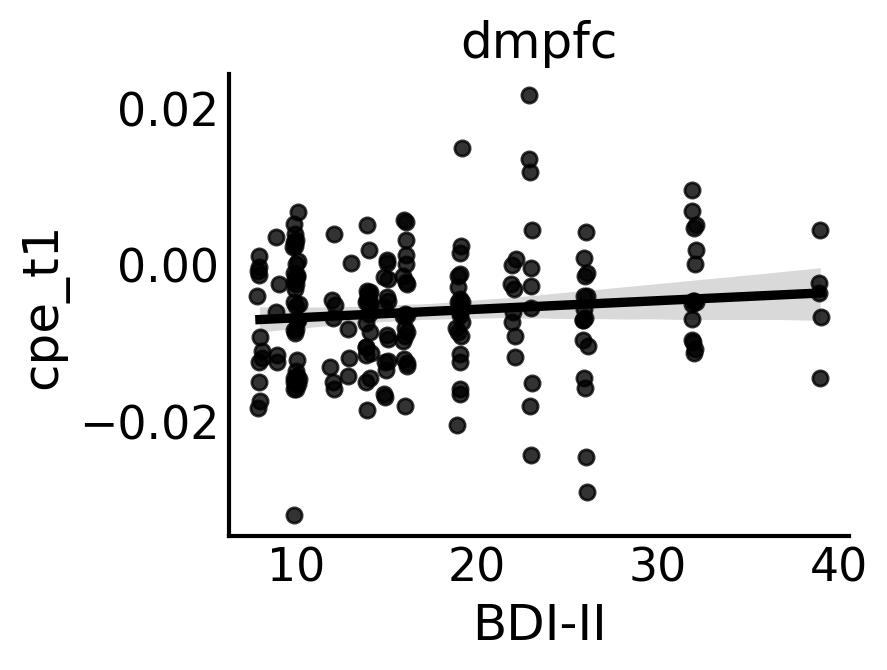

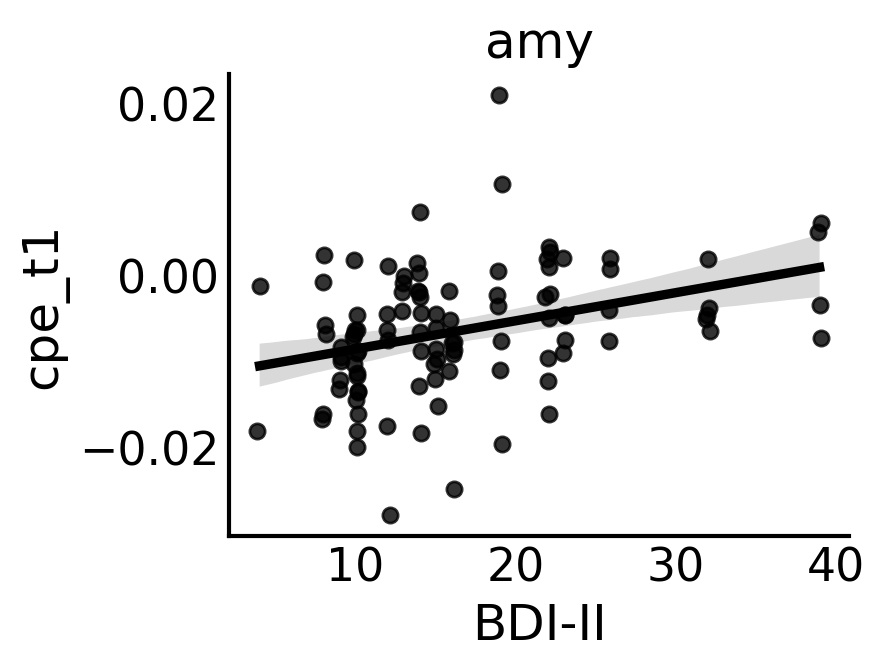

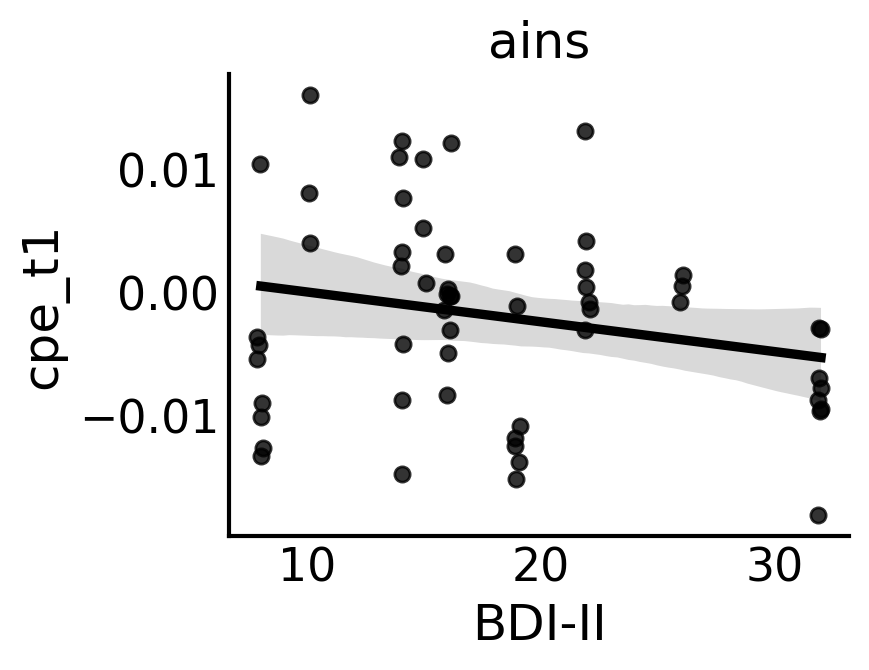

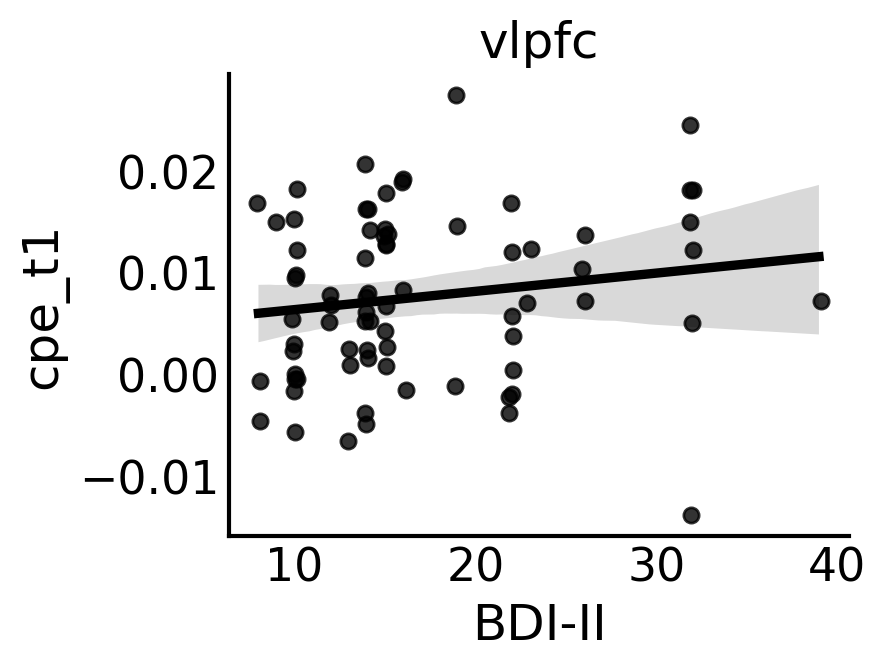

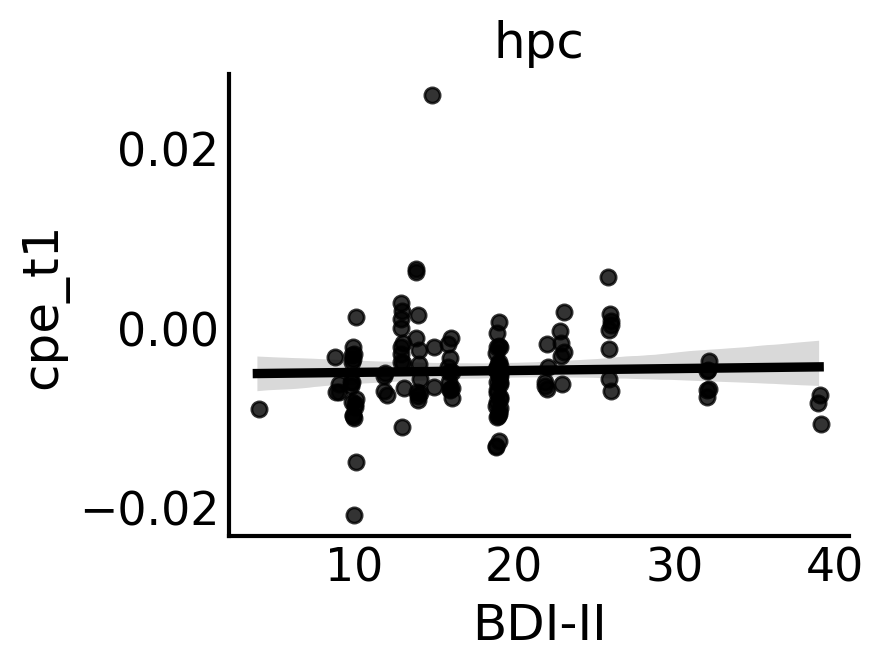

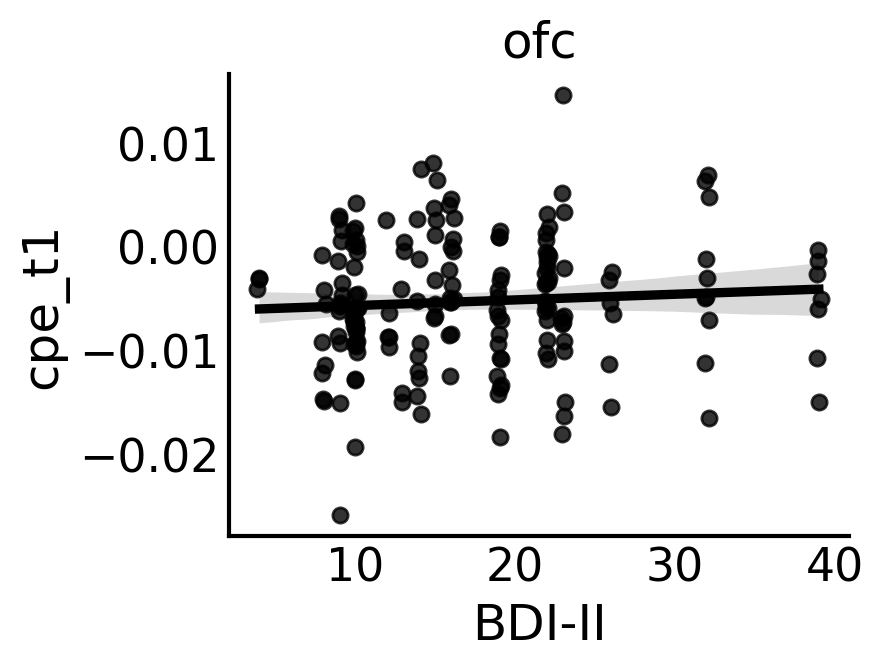

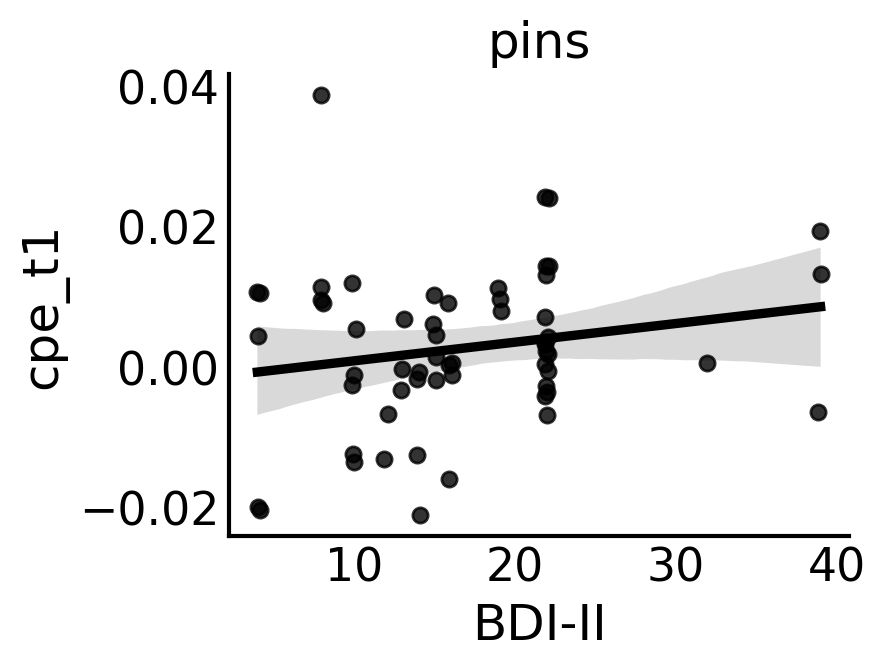

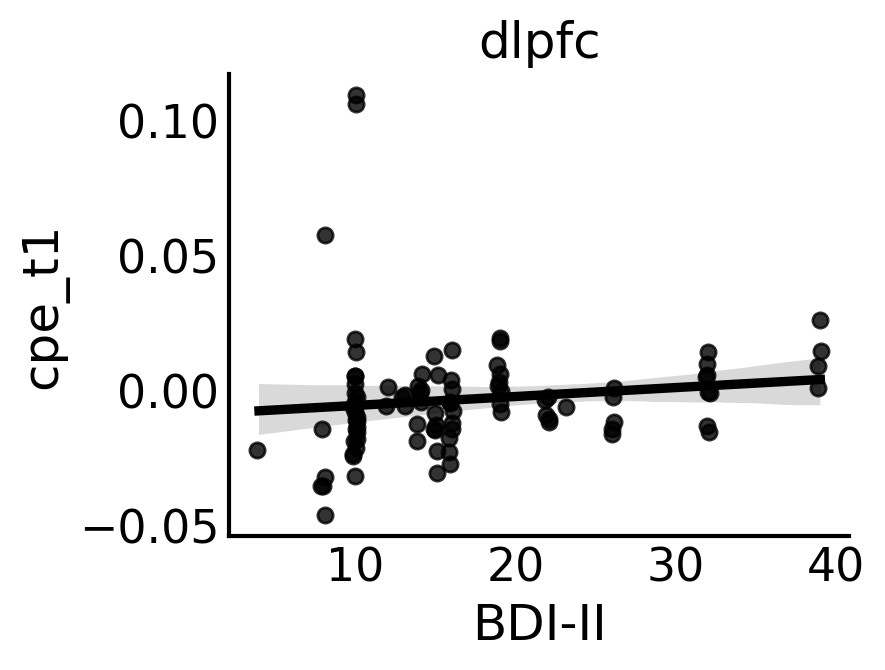

In [58]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [59]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df.cpe_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        22:17:26                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.8209      0.511     32.899     

# Mood-CPE Interaction BDI Correlation

In [60]:
# CHECK BDI CORRELATION

rho_data = []
sig_rho = []

# BDI CORRELATIONS
for roi in fit_results.region_type.unique().tolist():
    temp_data = fit_results[fit_results.region_type==roi]
    rho,rho_p     = pearsonr(temp_data.bdi,temp_data['norm_mood:cpe_t1'])
#     rho,rho_p     = pearsonr(roi_temp_data.bdi,roi_temp_data.elec_bCPE)
#     print(f'{roi} pearsonr',rho,rho_p)
    rho_data.append(pd.DataFrame({'roi':roi,'rho':rho,'rho_p':rho_p},index=[0]))
#     if rho_p <= bonferr_alpha:
#         sig_bdi_rois.append(roi)
#     if rho_p < bonferr_alpha:
    if rho_p < 0.05:
        sig_rho.append((roi,rho,rho_p))
    print(f'{roi} pearsonr',rho,rho_p)
rho_data = pd.concat(rho_data).reset_index(drop=True)


acc pearsonr 0.07153046208693363 0.35829869797230274
dmpfc pearsonr -0.07277305858626289 0.31452988652561553
amy pearsonr -0.22288797673730026 0.024339937904868512
ains pearsonr -0.1439982474931386 0.28522340935173124
vlpfc pearsonr -0.16784696340125127 0.15003248548608147
hpc pearsonr -0.0702411965962069 0.43821592942802495
ofc pearsonr -0.01800764759903365 0.8109059706484082
pins pearsonr 0.24985621744412737 0.05855130862999338
dlpfc pearsonr 0.0570660601596784 0.5828024487433944


In [61]:
sig_rho

[('amy', -0.22288797673730026, 0.024339937904868512)]

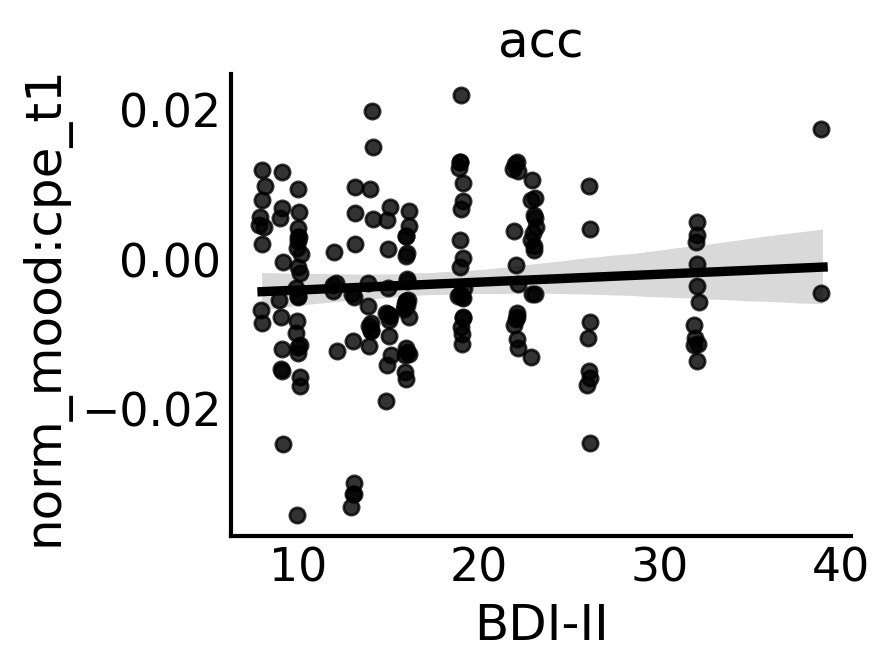

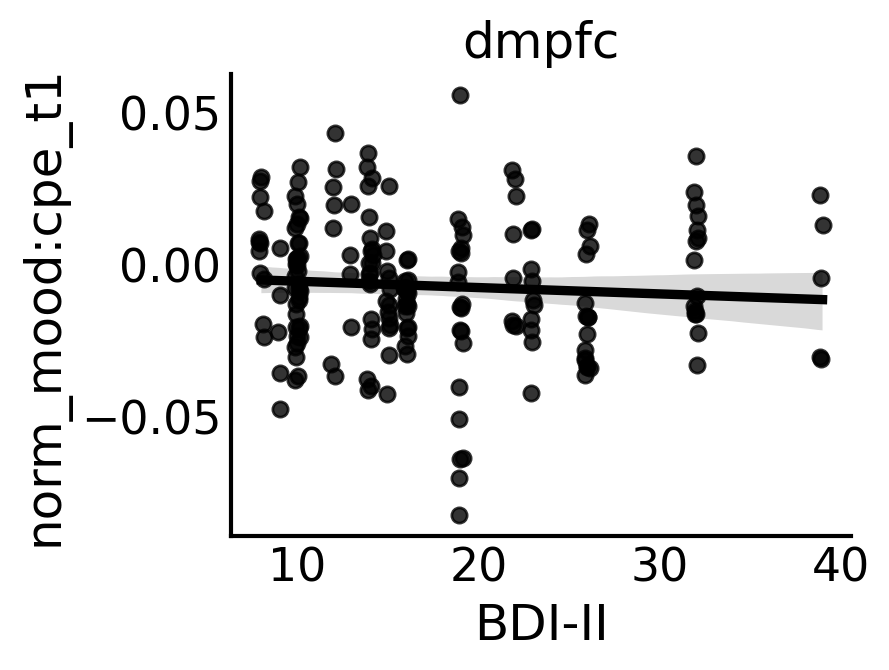

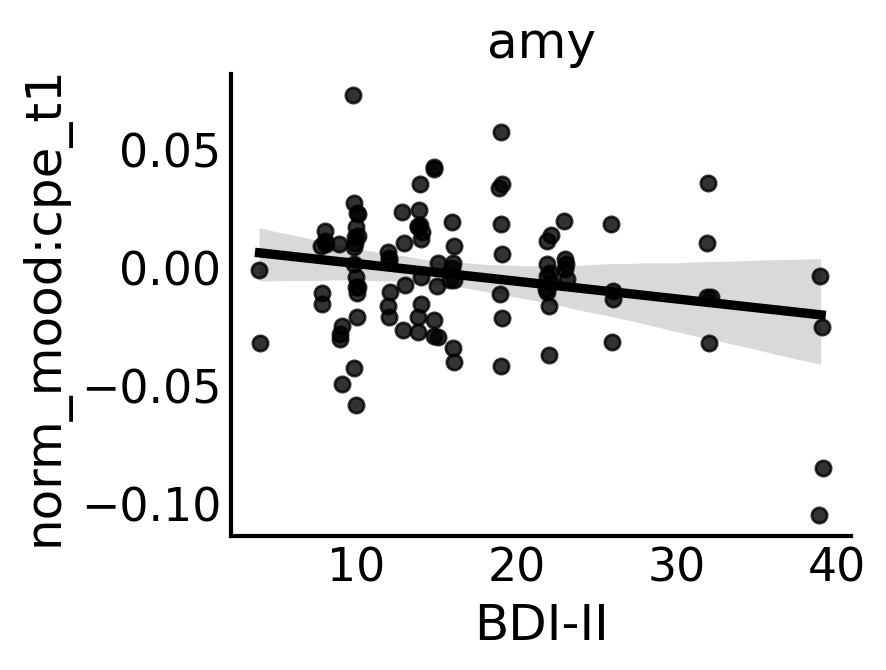

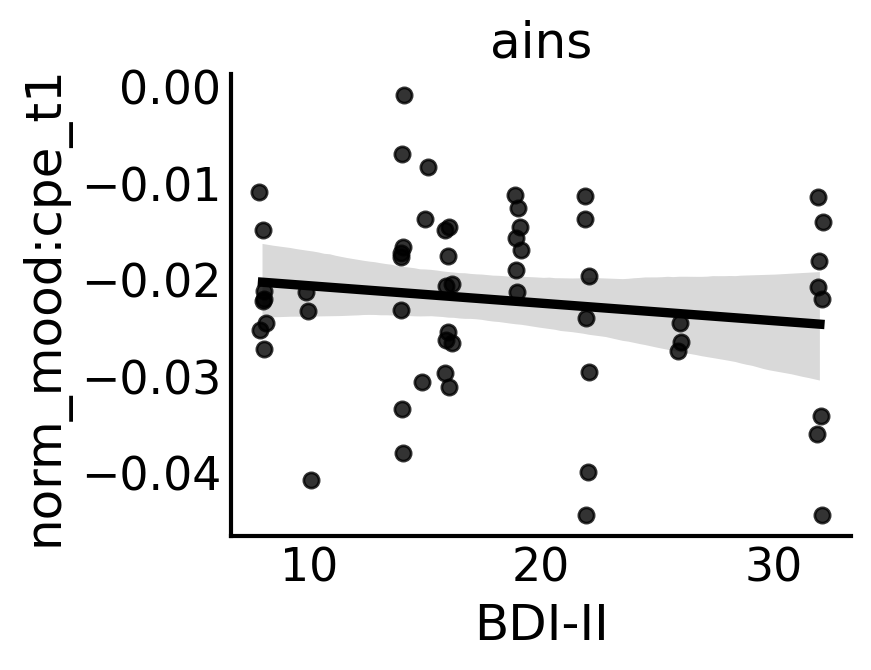

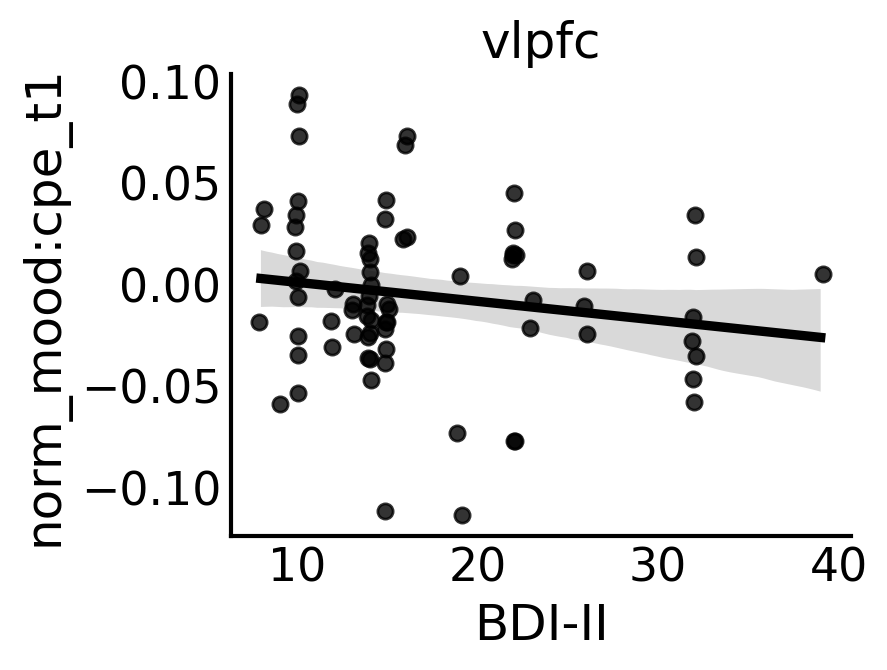

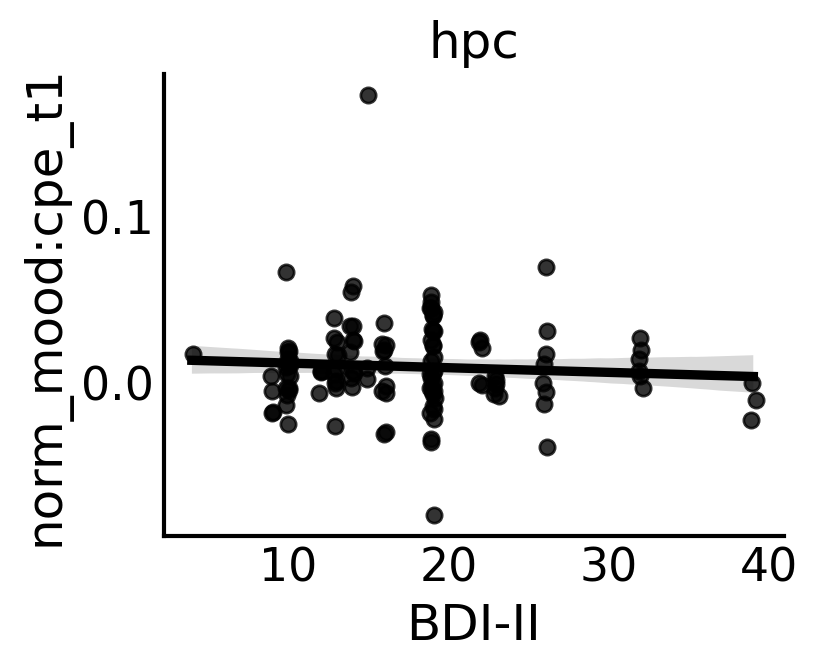

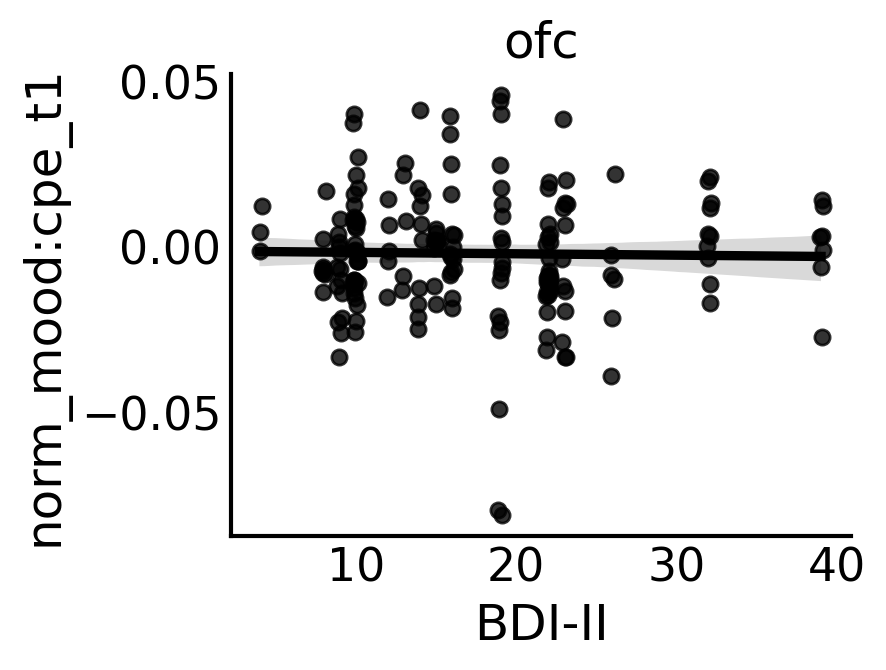

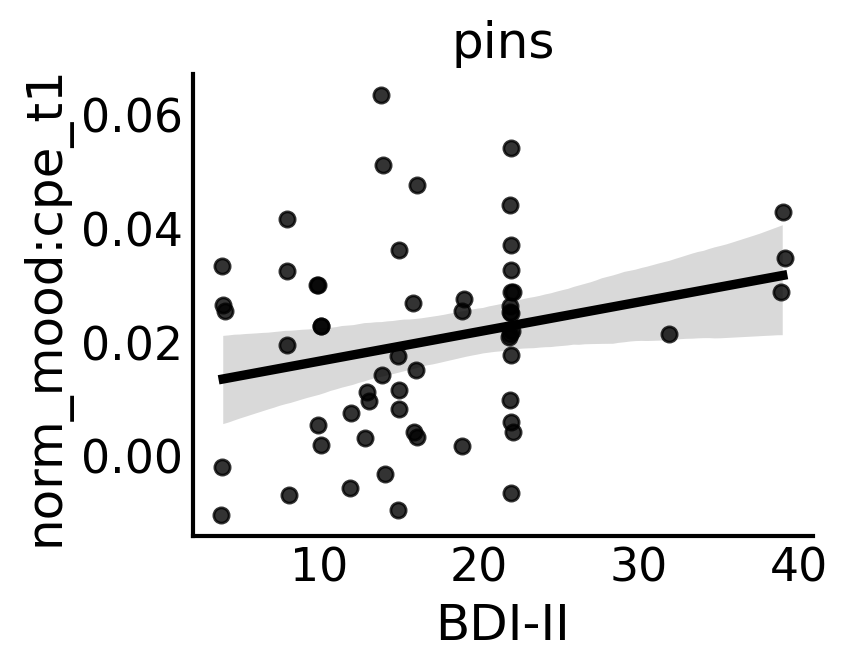

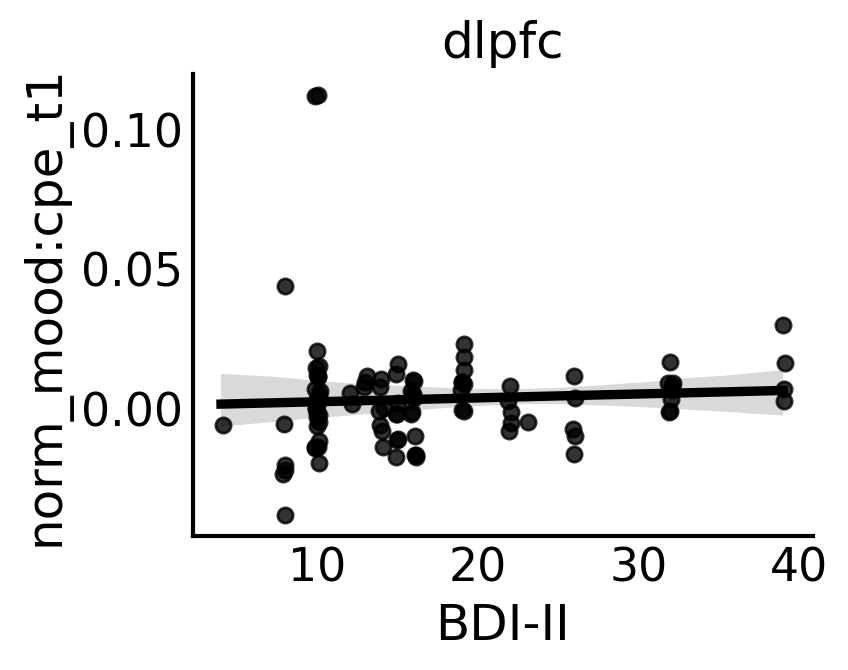

In [62]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='norm_mood:cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [63]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df['norm_mood:cpe_t1'].values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        22:17:29                                         
No. Iterations:                    12                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.6646      0.524     31.775     